# Conditional Generative Advarsarial Network 

Here is presented the implementation of the following parper https://arxiv.org/abs/1411.1784

This work is similar to the previous one but now the G(z) is replaced with G(z|y) and D(x) by D(x|y). 
Since we only need to modify the Generator and Discriminator network the previous code dont change to much (loss, otimization)

Implementation is done in tensorflow using KERAS API

Created by: Tiago Almeida 14/08/2018

In [34]:
##Reproduceble work
from numpy.random import seed
seed(42)
from tensorflow import set_random_seed
set_random_seed(42)


##imports
import tensorflow as tf
%matplotlib inline
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import os
import utils as ut # auxiliar file to help in data visualization
import tensorflow.keras.backend as K
#tensorflow version when notebook was created - 1.9.0
tf.__version__


'1.9.0'

### Data MNIST

Preparation of the data and some plots

Shape of the training images (60000, 784)


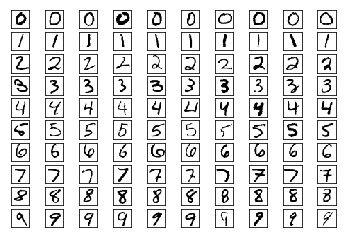

In [35]:
mnist_flat_size = 784

#mnist data

(x_train,y_train),(x_test,y_test) = tf.keras.datasets.mnist.load_data()

x_train = x_train.reshape([-1,mnist_flat_size]).astype('float32')
x_test = x_test.reshape([-1,mnist_flat_size]).astype('float32')

#rescale the image to [0-1] range
x_train = x_train/ 255
x_test = x_test/ 255


print("Shape of the training images",x_train.shape)


images_per_class = 10
images = np.zeros((10*images_per_class,mnist_flat_size))
for l in range(10):
    images[(l*images_per_class):(l*images_per_class+images_per_class)] = x_test[(y_test==l)][:images_per_class]
    
ut.plot_mnist_images_conditonal(images,per_class = images_per_class)


#reset graph using during notebook development
K.clear_session()



### Generator network - function G(Z|Y)

Same as GAN network, only diference is that input Z is concatenated with Y (lables)

In [36]:
from tensorflow.keras import Model,Input
from tensorflow.keras.layers import Dense,Activation,LeakyReLU, BatchNormalization, Concatenate
from tensorflow.keras.optimizers import Adam, RMSprop

#Dimention of random vector using for sampling
z = 100
labels = 10

g_input_z = Input(shape=[z], name="g_input_z")
g_input_labels = Input(shape=[labels], name="g_input_labels")
H = Concatenate()([g_input_z,g_input_labels])
H = Dense(128)(H)
H = Activation('relu')(H)
#H = Dense(256)(g_input)
#H = Activation('relu')(H)
H = Dense(mnist_flat_size)(H)
g_output = Activation('sigmoid')(H)
"""
#More advancer network
"""
generator = Model(inputs=[g_input_z,g_input_labels],outputs=[g_output], name="generator")
#No need to compile because he will use train with adversarial method
generator.summary()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
g_input_z (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
g_input_labels (InputLayer)     (None, 10)           0                                            
__________________________________________________________________________________________________
concatenate (Concatenate)       (None, 110)          0           g_input_z[0][0]                  
                                                                 g_input_labels[0][0]             
__________________________________________________________________________________________________
dense (Dense)                   (None, 128)          14208       concatenate[0][0]                
__________

### Discriminator network - function D(I|Y)

Same as GAN network, only diference is that input IMAGE (vector-784) is concatenated with Y (lables)

In [37]:

d_optimizer = Adam(lr=0.0003)


d_input_image = Input(shape=[mnist_flat_size],  name="d_input_image")
d_input_labels = Input(shape=[labels], name="d_input_labels")
H = Concatenate()([d_input_image,d_input_labels])
H = Dense(128)(H)
H = Activation('relu')(H)
H = Dense(1)(H)
d_output = Activation('sigmoid')(H)

"""
d_input = Input(shape=[mnist_flat_size],  name="d_input")
H = Dense(512)(d_input)
H = LeakyReLU(alpha=0.2)(H)
H = Dense(128)(H)
H = LeakyReLU(alpha=0.2)(H)
H = Dense(1)(H)
d_output = Activation('sigmoid')(H)
"""
discriminator = Model(inputs=[d_input_image,d_input_labels],outputs=[d_output], name="discriminator")
discriminator.compile(loss='binary_crossentropy', optimizer=d_optimizer, metrics=['accuracy'])
discriminator.summary()



__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
d_input_image (InputLayer)      (None, 784)          0                                            
__________________________________________________________________________________________________
d_input_labels (InputLayer)     (None, 10)           0                                            
__________________________________________________________________________________________________
concatenate_1 (Concatenate)     (None, 794)          0           d_input_image[0][0]              
                                                                 d_input_labels[0][0]             
__________________________________________________________________________________________________
dense_2 (Dense)                 (None, 128)          101760      concatenate_1[0][0]              
__________

### Adversarial Model - function D(G(Z|Y)|Y)

Used to train the generator

In [38]:

def make_trainable(net, val=True):
    net.trainable = val
    for l in net.layers:
        l.trainable = val

# Freeze weights in the discriminator for adversarial training
make_trainable(discriminator, False)

gan_optimizer = Adam(lr=0.0003)

# Build stacked GAN model to train the generator
gan_input_z = Input(shape=[z], name="gan_z_input")
gan_input_labels = Input(shape=[labels], name="gan_z_labels")
gan_fake_samples = generator([gan_input_z, gan_input_labels])
gan_output = discriminator([gan_fake_samples, gan_input_labels])

gan = Model(inputs=[gan_input_z, gan_input_labels],outputs=[gan_output], name="generator_adversarial")
gan.compile(loss='binary_crossentropy', optimizer=gan_optimizer, metrics=['accuracy'])
gan.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
gan_z_input (InputLayer)        (None, 100)          0                                            
__________________________________________________________________________________________________
gan_z_labels (InputLayer)       (None, 10)           0                                            
__________________________________________________________________________________________________
generator (Model)               (None, 784)          115344      gan_z_input[0][0]                
                                                                 gan_z_labels[0][0]               
__________________________________________________________________________________________________
discriminator (Model)           (None, 1)            101889      generator[1][0]                  
          

### Training Algorithm


Discriminator loss:  1.1421679
Generator loss: 0.34754673


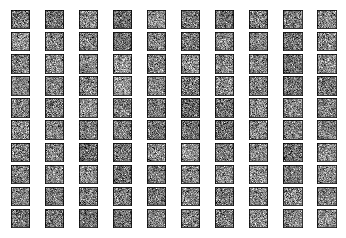


 Plot learning curves 



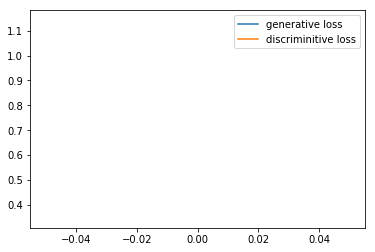


 Plot learning acc 



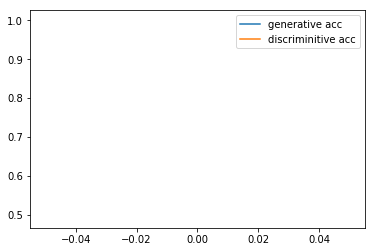

Discriminator loss:  0.09781688
Generator loss: 3.32957


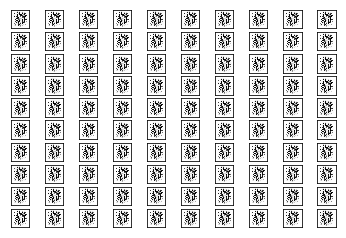


 Plot learning curves 



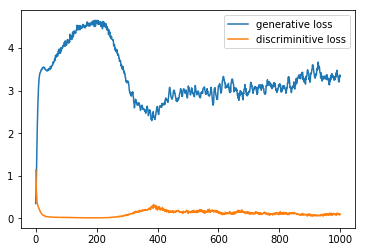


 Plot learning acc 



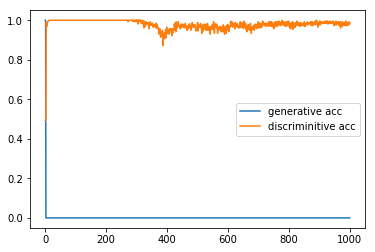

Discriminator loss:  0.07111524
Generator loss: 5.114323


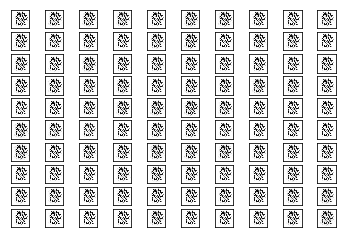


 Plot learning curves 



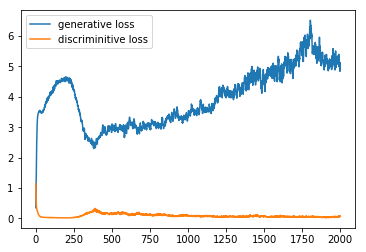


 Plot learning acc 



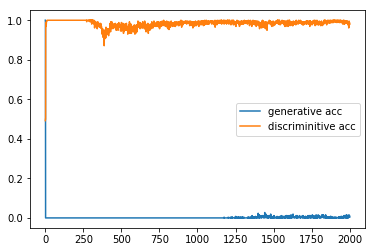

Discriminator loss:  0.16736813
Generator loss: 2.2517633


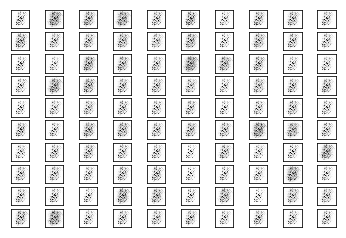


 Plot learning curves 



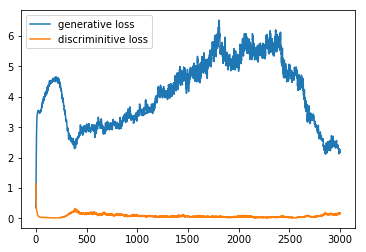


 Plot learning acc 



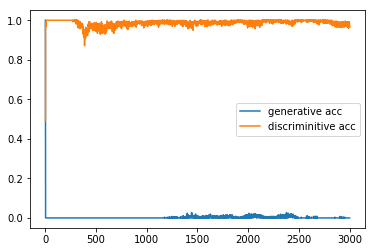

Discriminator loss:  0.04910497
Generator loss: 3.9796615


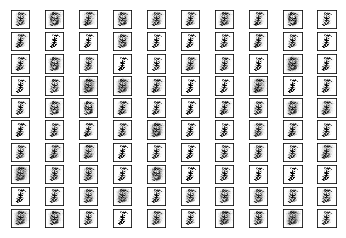


 Plot learning curves 



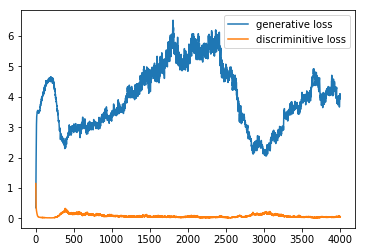


 Plot learning acc 



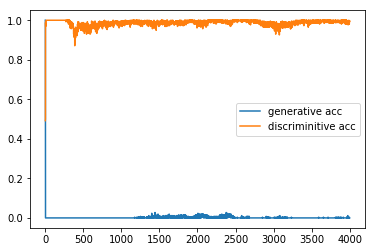

Discriminator loss:  0.06234106
Generator loss: 3.5319057


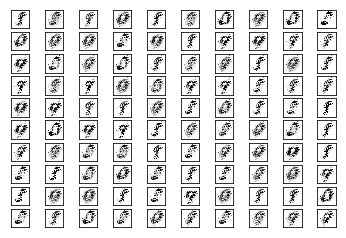


 Plot learning curves 



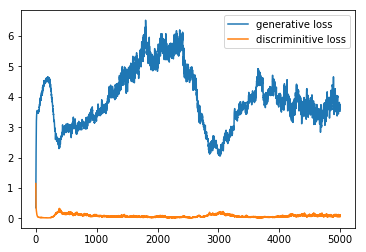


 Plot learning acc 



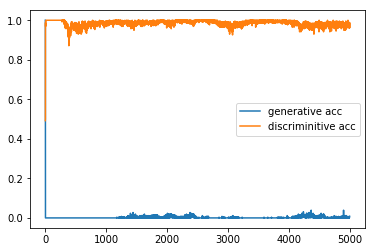

Discriminator loss:  0.07191955
Generator loss: 4.643612


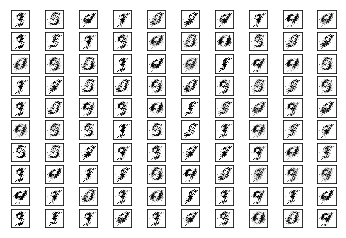


 Plot learning curves 



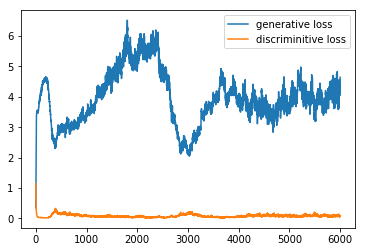


 Plot learning acc 



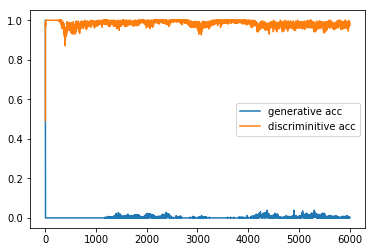

Discriminator loss:  0.051065348
Generator loss: 5.14079


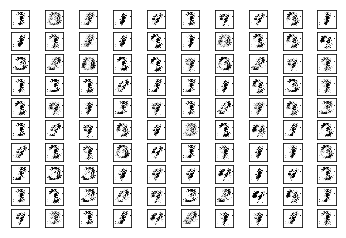


 Plot learning curves 



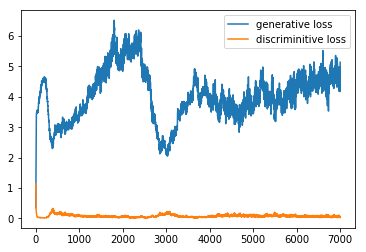


 Plot learning acc 



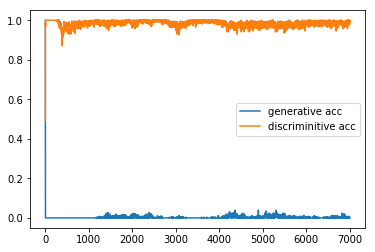

Discriminator loss:  0.05405604
Generator loss: 4.237147


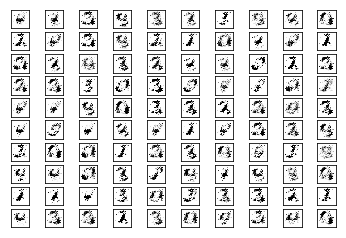


 Plot learning curves 



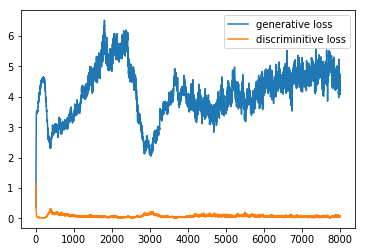


 Plot learning acc 



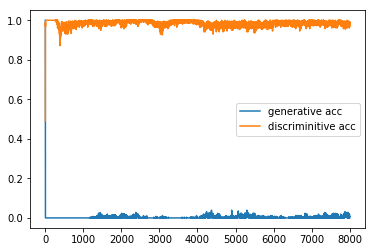

Discriminator loss:  0.07032991
Generator loss: 4.4015226


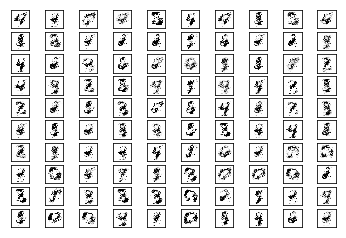


 Plot learning curves 



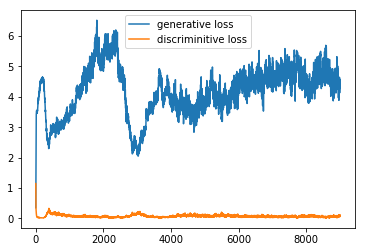


 Plot learning acc 



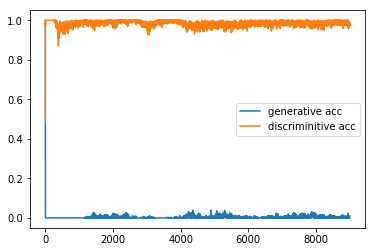

Discriminator loss:  0.042681254
Generator loss: 4.5274954


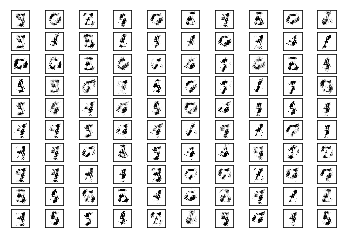


 Plot learning curves 



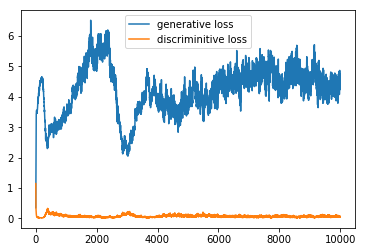


 Plot learning acc 



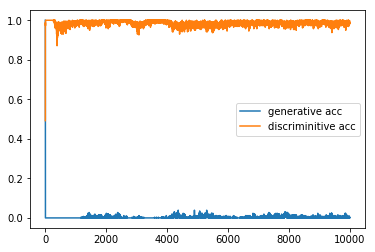

Discriminator loss:  0.044081785
Generator loss: 4.717599


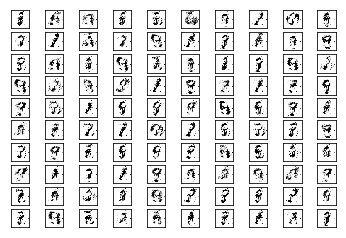


 Plot learning curves 



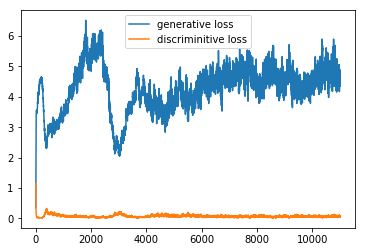


 Plot learning acc 



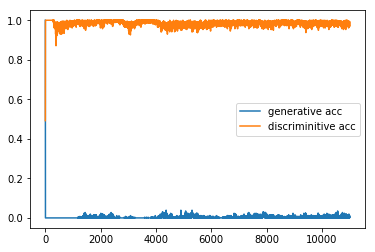

Discriminator loss:  0.0681368
Generator loss: 5.0314026


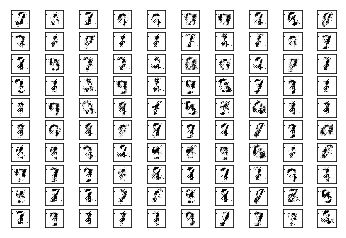


 Plot learning curves 



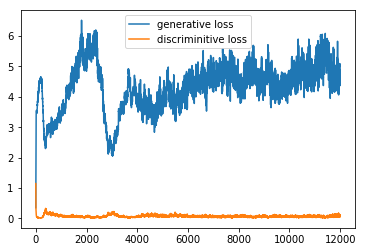


 Plot learning acc 



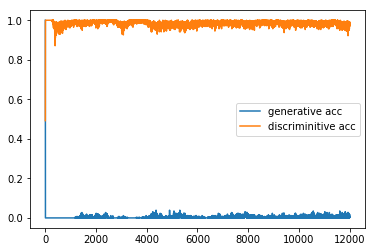

Discriminator loss:  0.08650803
Generator loss: 5.042164


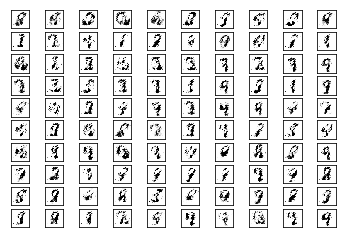


 Plot learning curves 



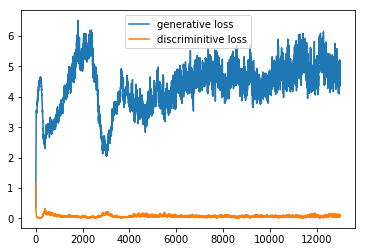


 Plot learning acc 



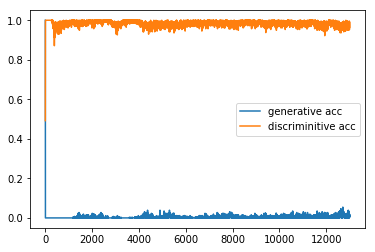

Discriminator loss:  0.097606435
Generator loss: 4.4057903


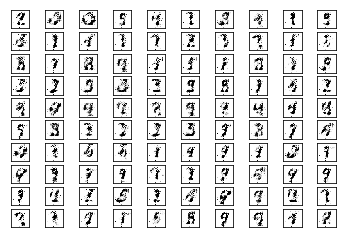


 Plot learning curves 



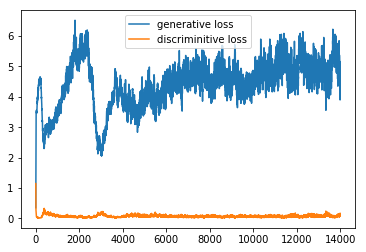


 Plot learning acc 



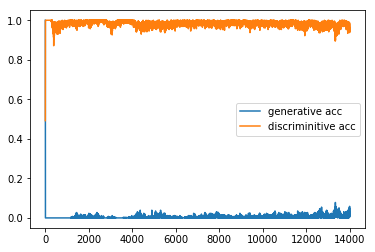

Discriminator loss:  0.14791211
Generator loss: 4.077991


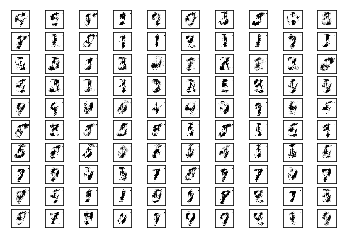


 Plot learning curves 



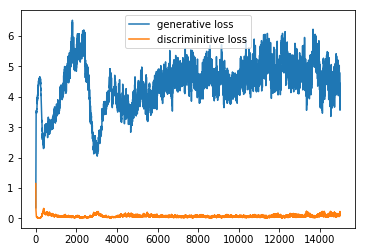


 Plot learning acc 



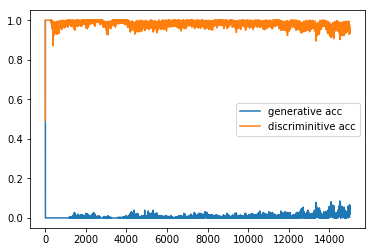

Discriminator loss:  0.1064471
Generator loss: 4.7312565


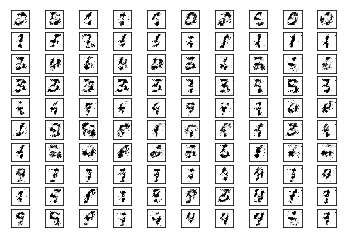


 Plot learning curves 



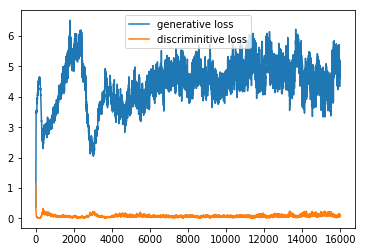


 Plot learning acc 



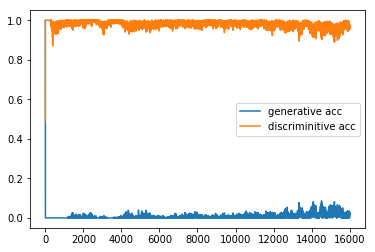

Discriminator loss:  0.043004606
Generator loss: 5.578762


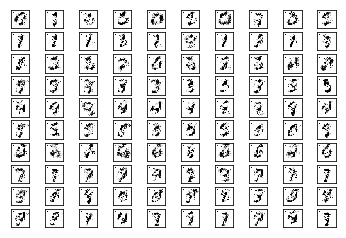


 Plot learning curves 



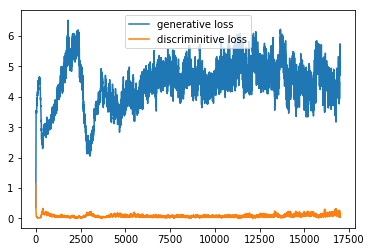


 Plot learning acc 



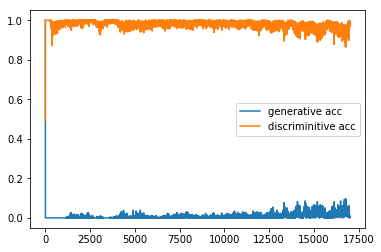

Discriminator loss:  0.1510014
Generator loss: 4.126627


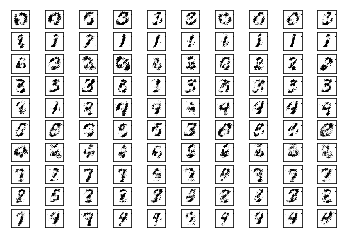


 Plot learning curves 



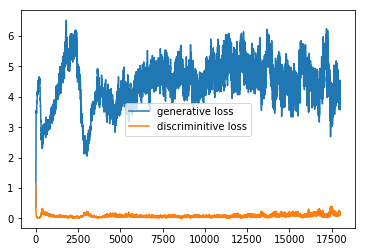


 Plot learning acc 



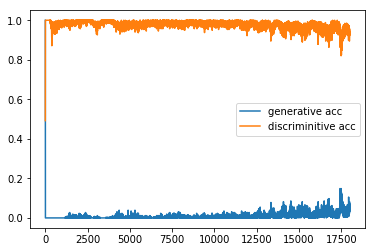

Discriminator loss:  0.24178919
Generator loss: 3.0522504


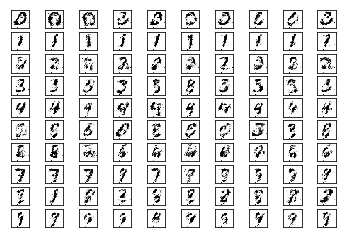


 Plot learning curves 



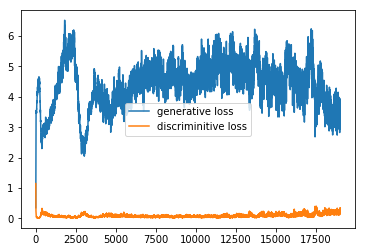


 Plot learning acc 



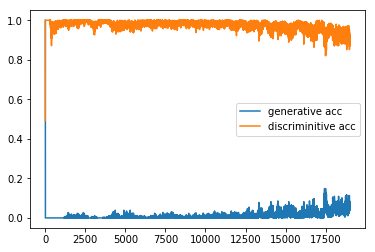

Discriminator loss:  0.17298037
Generator loss: 3.2883353


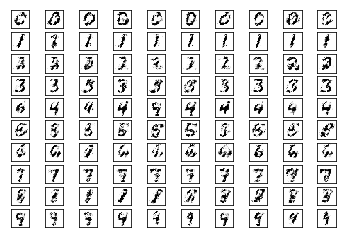


 Plot learning curves 



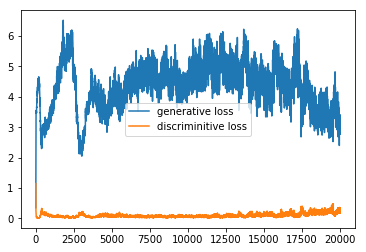


 Plot learning acc 



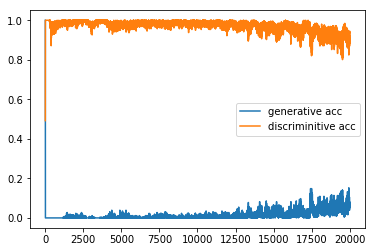

Discriminator loss:  0.23050913
Generator loss: 2.7347736


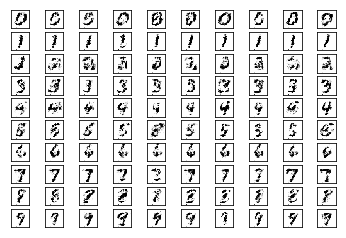


 Plot learning curves 



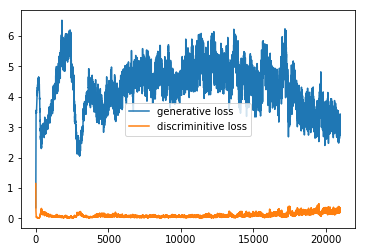


 Plot learning acc 



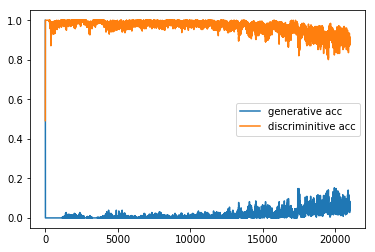

Discriminator loss:  0.24160379
Generator loss: 2.740291


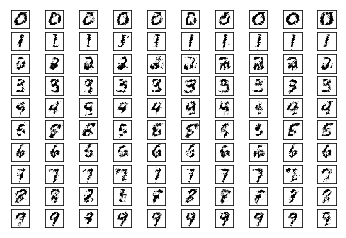


 Plot learning curves 



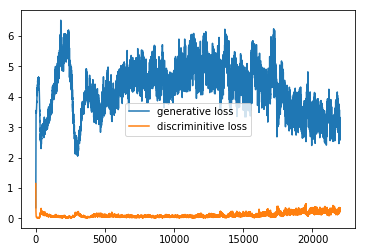


 Plot learning acc 



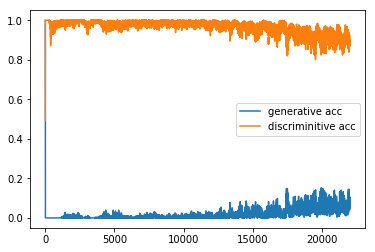

Discriminator loss:  0.22968191
Generator loss: 2.6981099


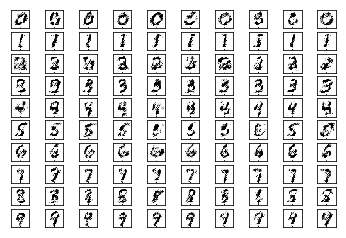


 Plot learning curves 



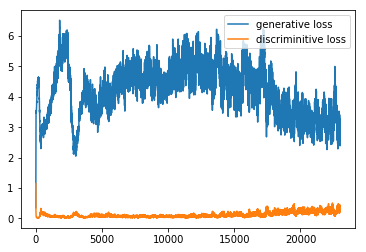


 Plot learning acc 



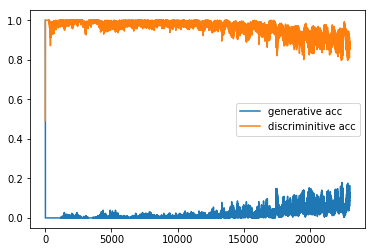

Discriminator loss:  0.3287549
Generator loss: 2.4769864


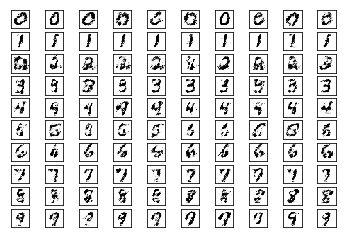


 Plot learning curves 



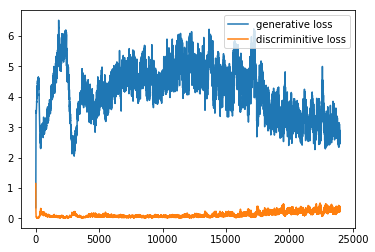


 Plot learning acc 



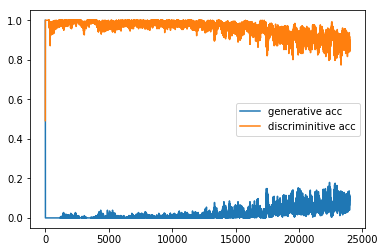

Discriminator loss:  0.28499782
Generator loss: 2.969993


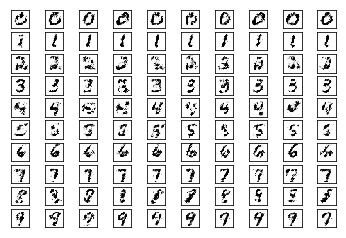


 Plot learning curves 



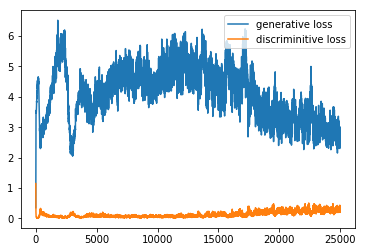


 Plot learning acc 



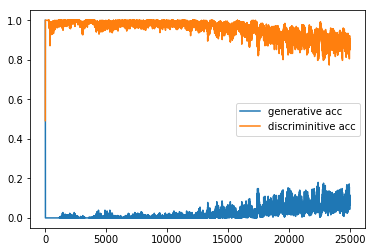

Discriminator loss:  0.27686492
Generator loss: 2.5122404


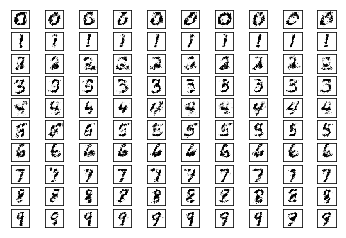


 Plot learning curves 



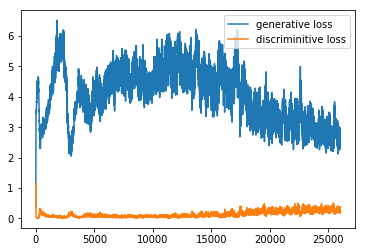


 Plot learning acc 



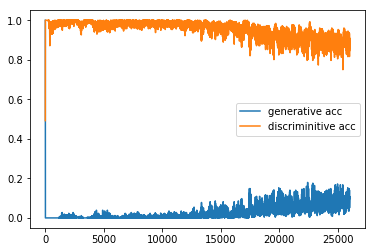

Discriminator loss:  0.42881954
Generator loss: 2.3563738


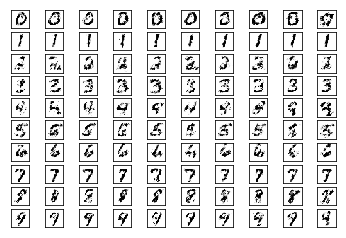


 Plot learning curves 



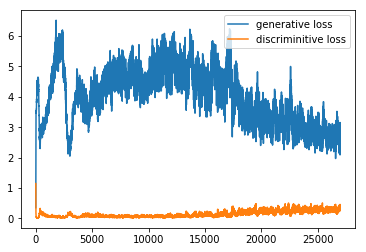


 Plot learning acc 



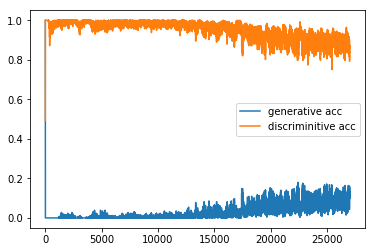

Discriminator loss:  0.32732636
Generator loss: 2.2976658


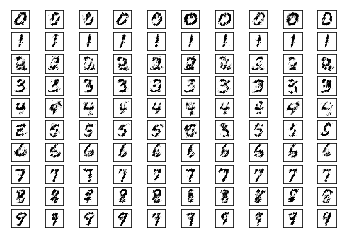


 Plot learning curves 



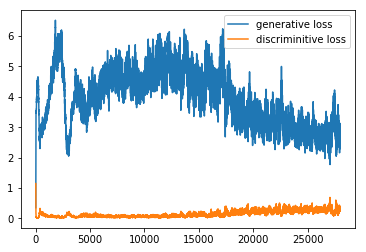


 Plot learning acc 



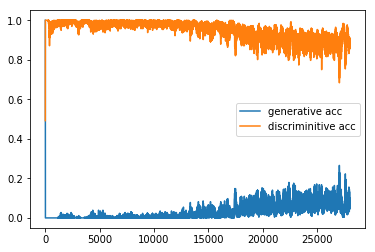

Discriminator loss:  0.33531886
Generator loss: 2.698389


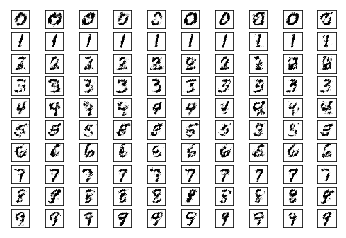


 Plot learning curves 



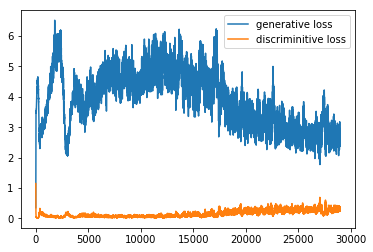


 Plot learning acc 



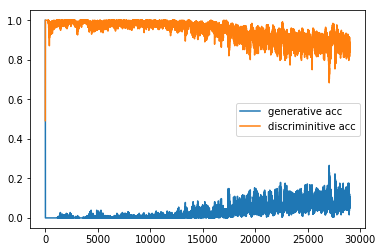

Discriminator loss:  0.22417662
Generator loss: 2.8212607


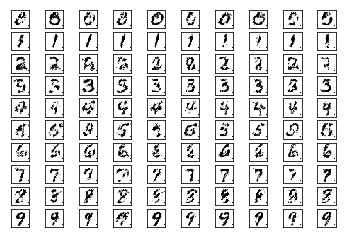


 Plot learning curves 



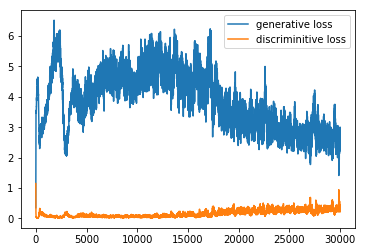


 Plot learning acc 



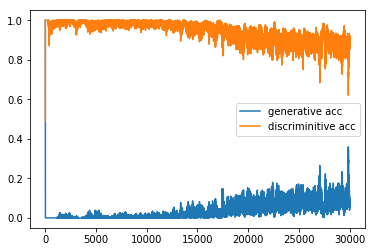

Discriminator loss:  0.356567
Generator loss: 2.40338


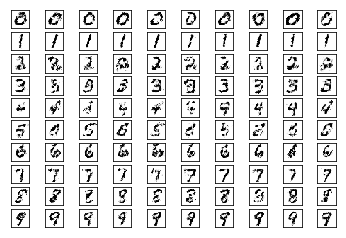


 Plot learning curves 



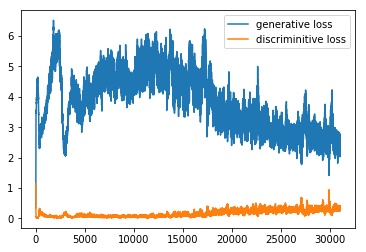


 Plot learning acc 



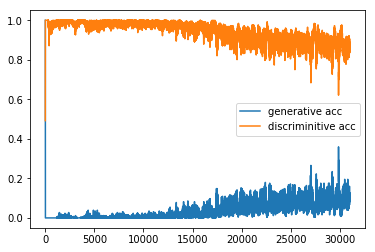

Discriminator loss:  0.3619961
Generator loss: 2.1636648


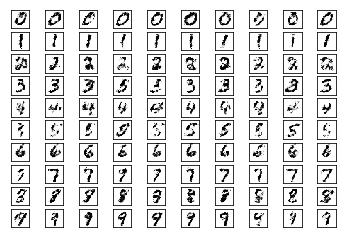


 Plot learning curves 



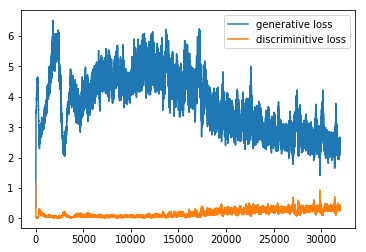


 Plot learning acc 



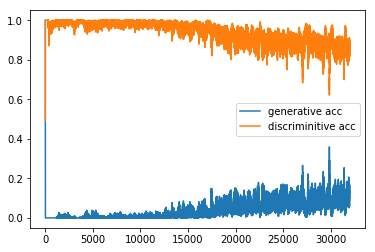

Discriminator loss:  0.2957937
Generator loss: 2.7914267


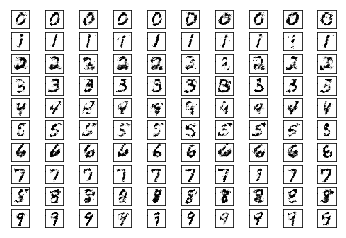


 Plot learning curves 



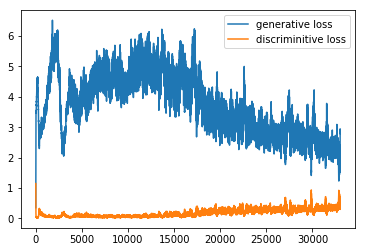


 Plot learning acc 



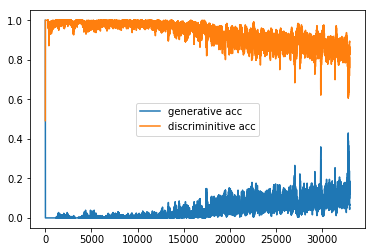

Discriminator loss:  0.37668452
Generator loss: 2.142988


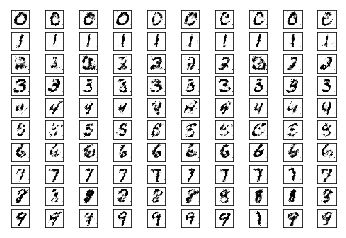


 Plot learning curves 



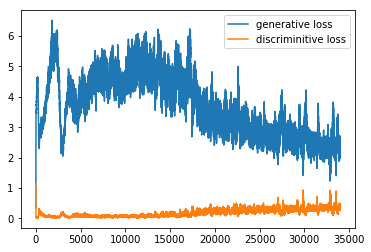


 Plot learning acc 



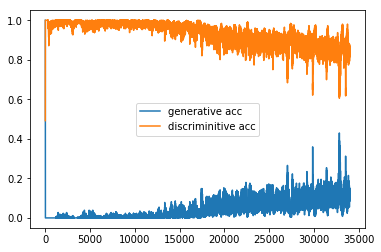

Discriminator loss:  0.39174443
Generator loss: 2.0468774


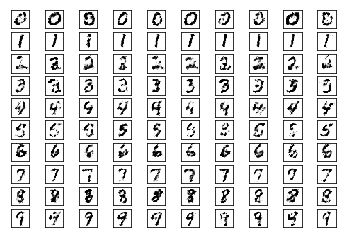


 Plot learning curves 



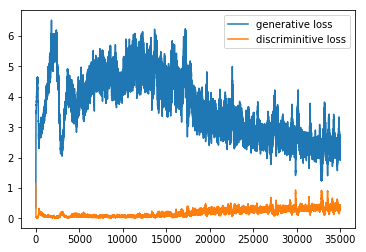


 Plot learning acc 



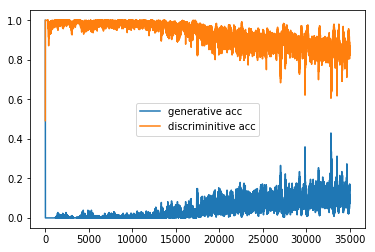

Discriminator loss:  0.31147724
Generator loss: 2.3663645


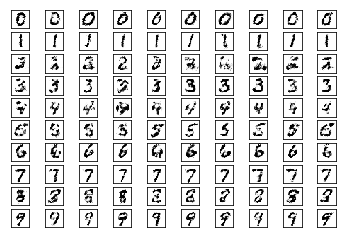


 Plot learning curves 



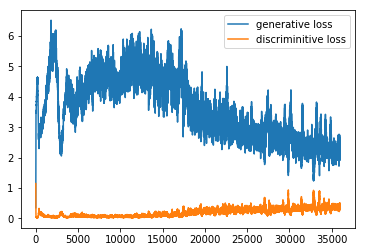


 Plot learning acc 



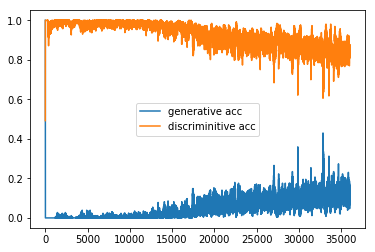

Discriminator loss:  0.3081885
Generator loss: 2.0399864


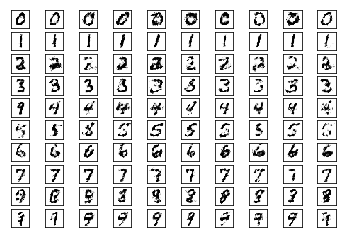


 Plot learning curves 



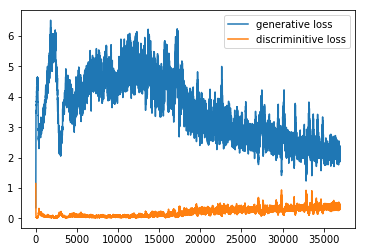


 Plot learning acc 



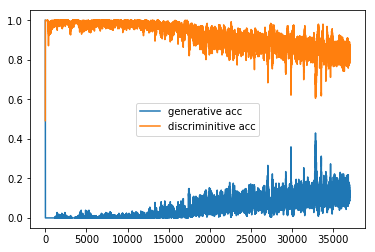

Discriminator loss:  0.34656215
Generator loss: 1.8276694


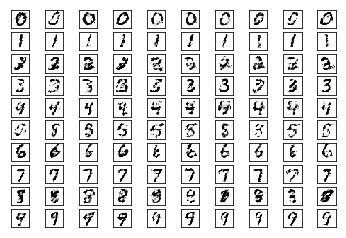


 Plot learning curves 



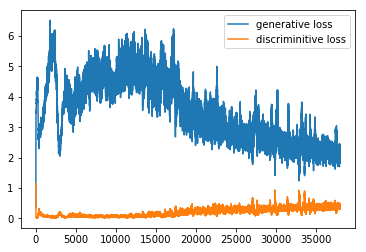


 Plot learning acc 



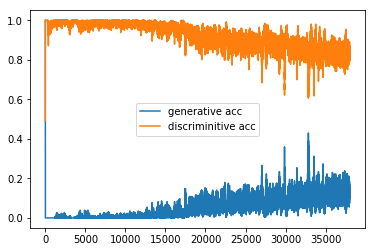

Discriminator loss:  0.37315685
Generator loss: 1.8425307


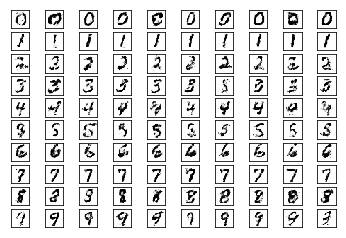


 Plot learning curves 



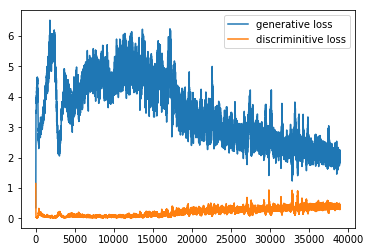


 Plot learning acc 



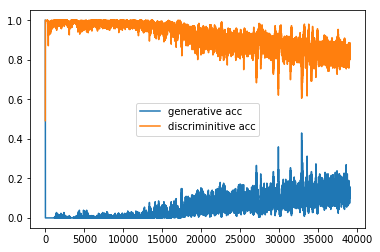

Discriminator loss:  0.42896068
Generator loss: 1.8596258


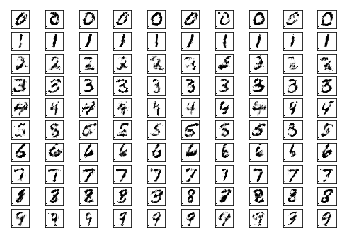


 Plot learning curves 



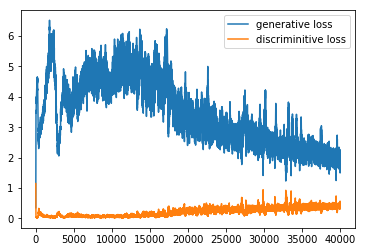


 Plot learning acc 



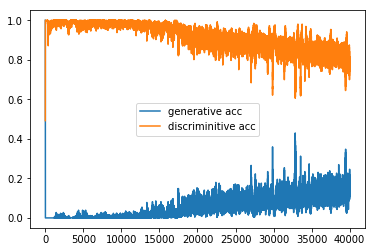

Discriminator loss:  0.33485815
Generator loss: 2.2233512


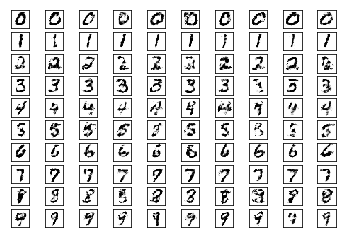


 Plot learning curves 



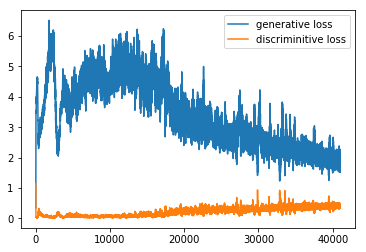


 Plot learning acc 



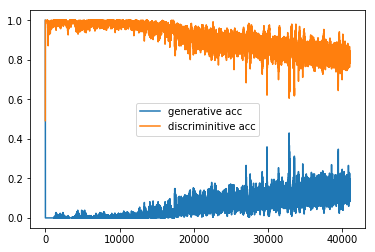

Discriminator loss:  0.4282814
Generator loss: 1.8107226


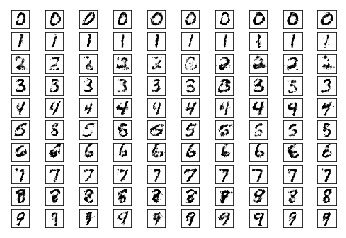


 Plot learning curves 



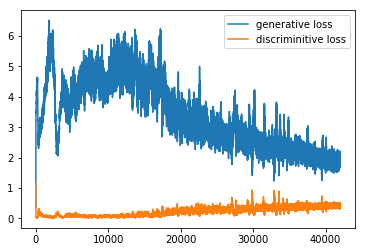


 Plot learning acc 



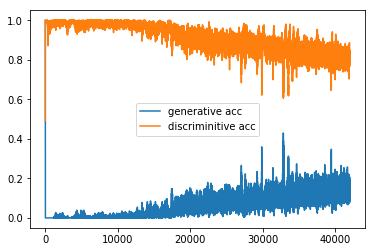

Discriminator loss:  0.4025771
Generator loss: 1.8967171


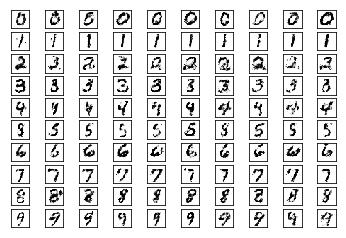


 Plot learning curves 



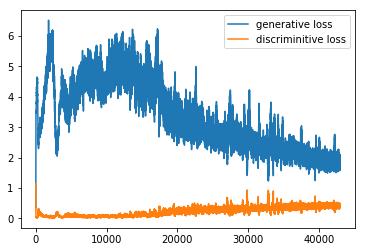


 Plot learning acc 



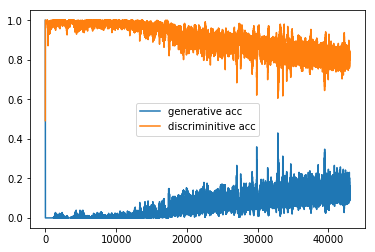

Discriminator loss:  0.42102185
Generator loss: 1.6262773


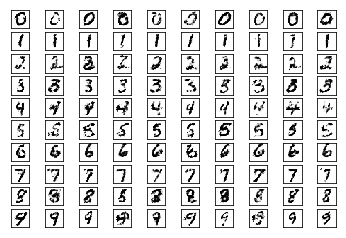


 Plot learning curves 



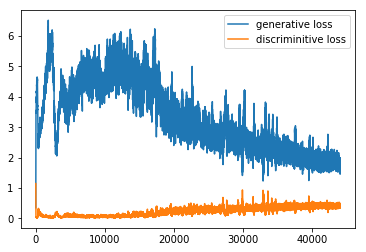


 Plot learning acc 



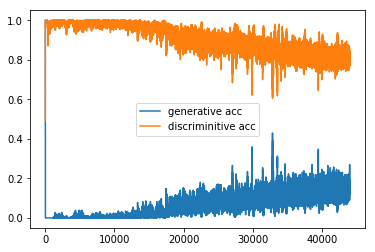

Discriminator loss:  0.37625843
Generator loss: 1.9776278


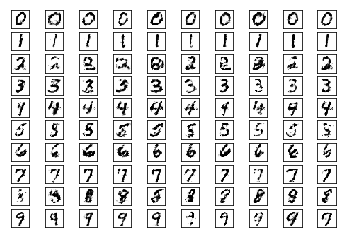


 Plot learning curves 



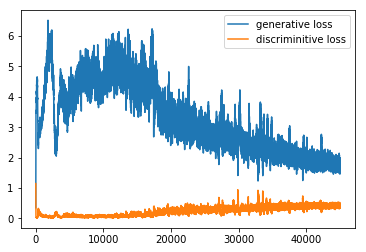


 Plot learning acc 



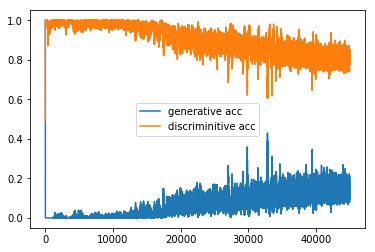

Discriminator loss:  0.42138255
Generator loss: 1.6407015


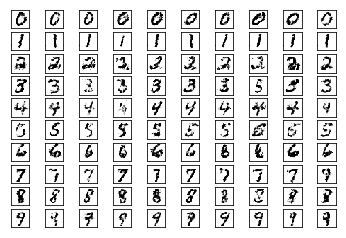


 Plot learning curves 



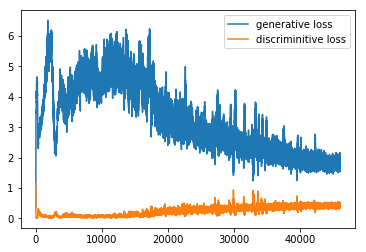


 Plot learning acc 



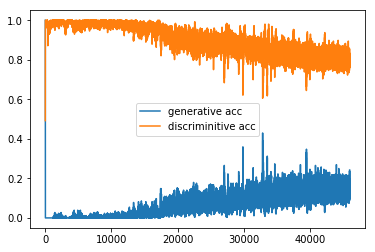

Discriminator loss:  0.35195565
Generator loss: 1.896625


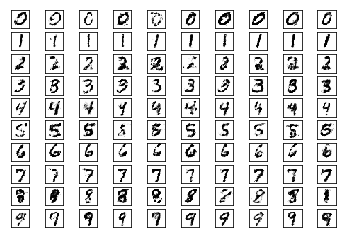


 Plot learning curves 



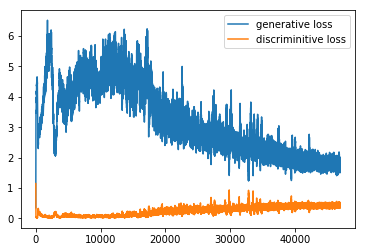


 Plot learning acc 



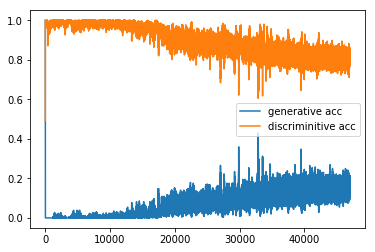

Discriminator loss:  0.39246595
Generator loss: 1.7583655


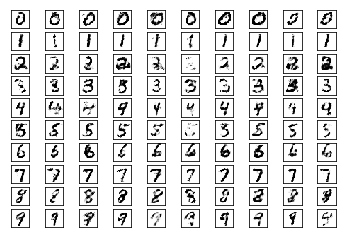


 Plot learning curves 



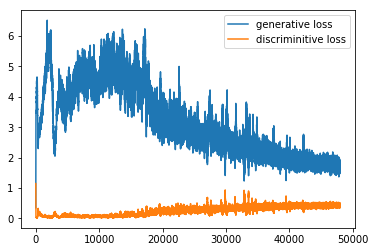


 Plot learning acc 



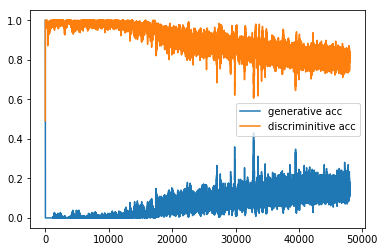

Discriminator loss:  0.40497693
Generator loss: 1.5229843


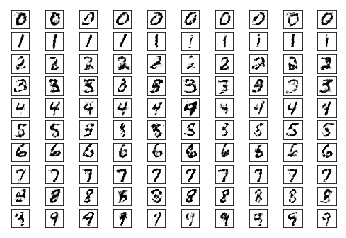


 Plot learning curves 



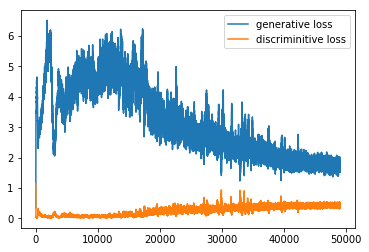


 Plot learning acc 



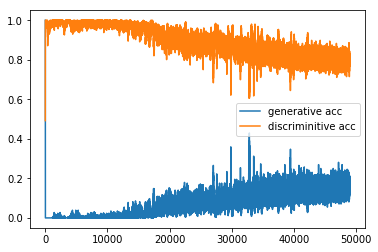

Discriminator loss:  0.37045258
Generator loss: 1.8132503


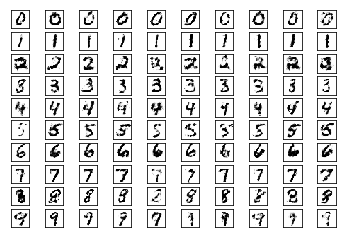


 Plot learning curves 



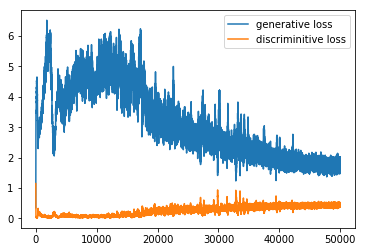


 Plot learning acc 



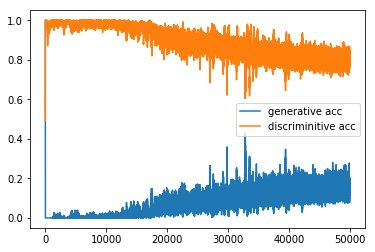

Discriminator loss:  0.3929162
Generator loss: 1.7397559


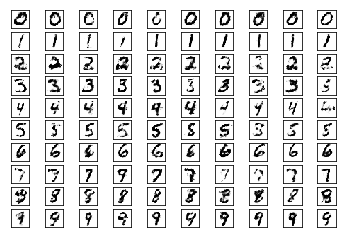


 Plot learning curves 



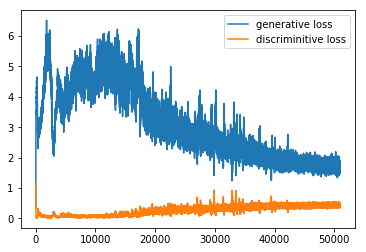


 Plot learning acc 



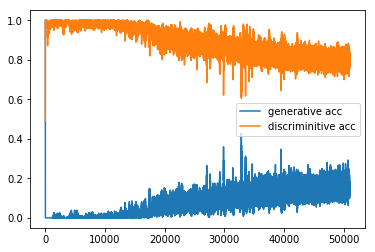

Discriminator loss:  0.3693085
Generator loss: 1.7660906


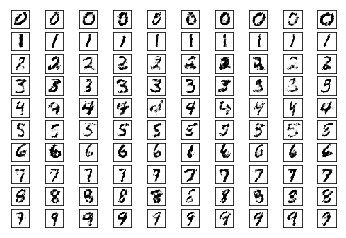


 Plot learning curves 



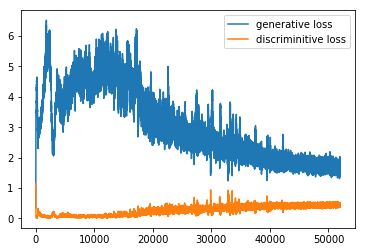


 Plot learning acc 



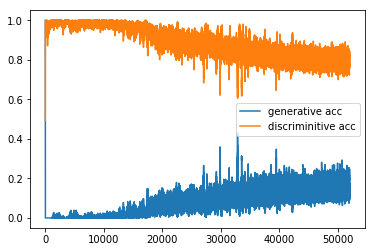

Discriminator loss:  0.47745168
Generator loss: 1.7371798


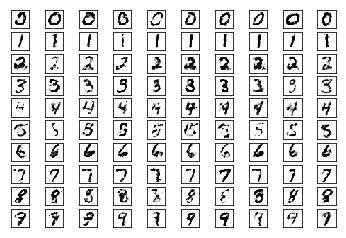


 Plot learning curves 



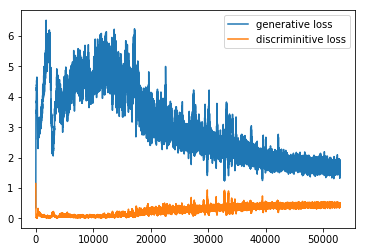


 Plot learning acc 



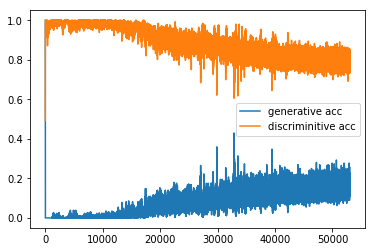

Discriminator loss:  0.45255786
Generator loss: 1.6270373


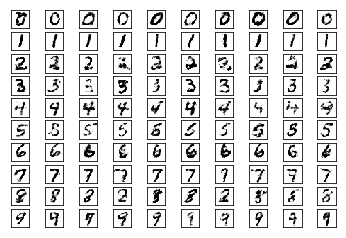


 Plot learning curves 



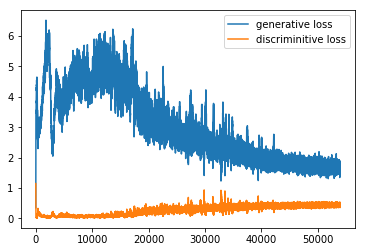


 Plot learning acc 



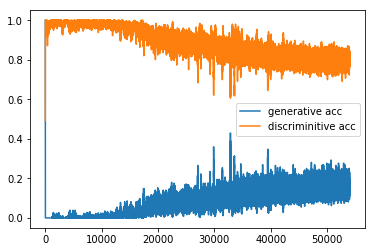

Discriminator loss:  0.45447585
Generator loss: 1.6125245


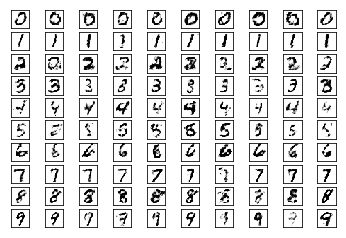


 Plot learning curves 



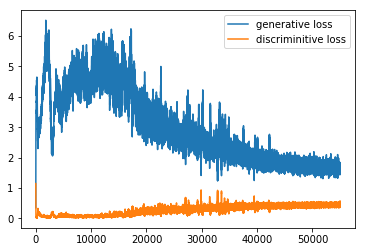


 Plot learning acc 



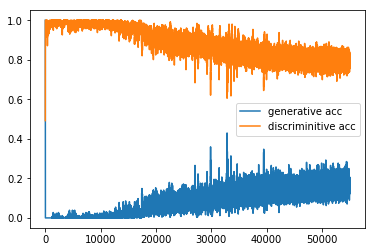

Discriminator loss:  0.45124573
Generator loss: 1.6712927


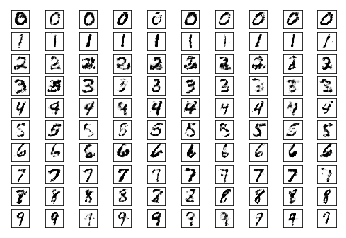


 Plot learning curves 



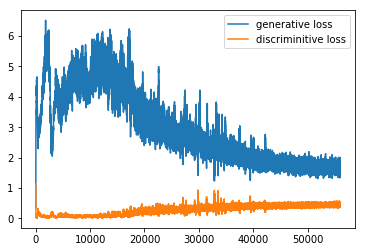


 Plot learning acc 



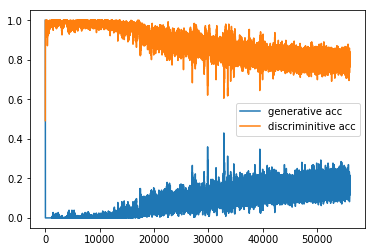

Discriminator loss:  0.46339846
Generator loss: 1.5708857


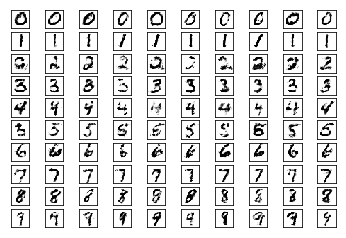


 Plot learning curves 



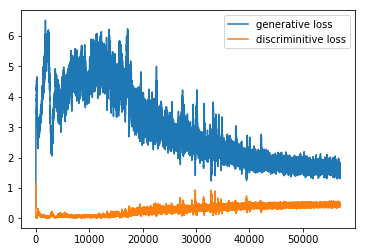


 Plot learning acc 



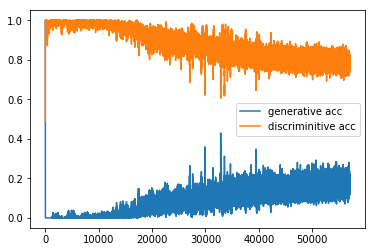

Discriminator loss:  0.5291559
Generator loss: 1.637274


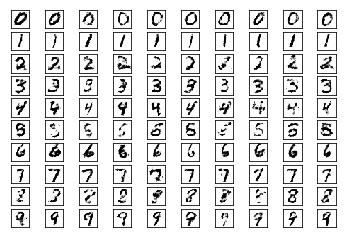


 Plot learning curves 



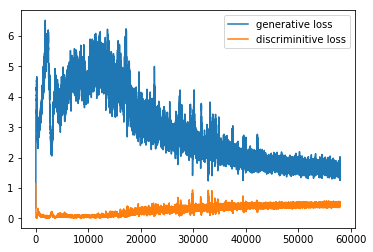


 Plot learning acc 



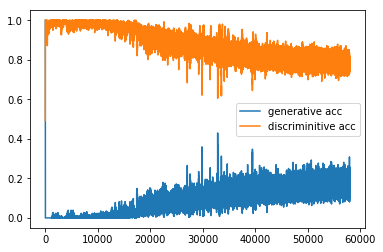

Discriminator loss:  0.44026548
Generator loss: 1.6642504


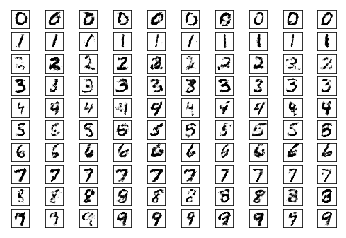


 Plot learning curves 



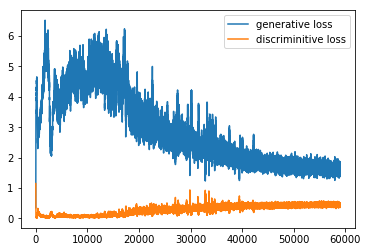


 Plot learning acc 



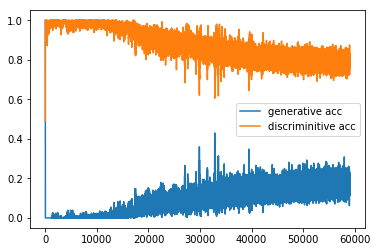

Discriminator loss:  0.43682477
Generator loss: 1.7154841


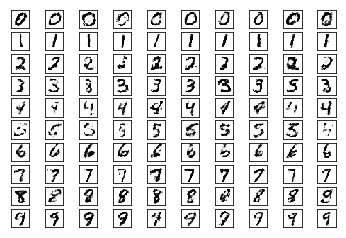


 Plot learning curves 



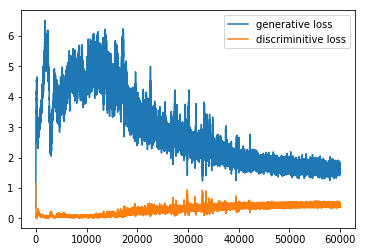


 Plot learning acc 



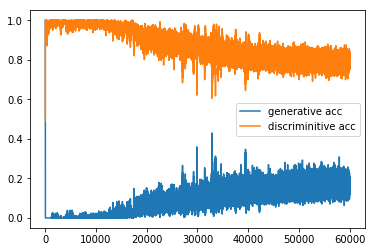

Discriminator loss:  0.4415463
Generator loss: 1.729908


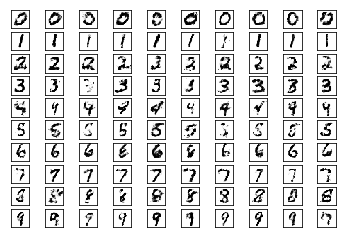


 Plot learning curves 



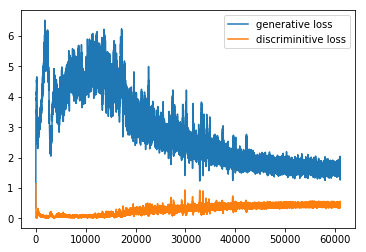


 Plot learning acc 



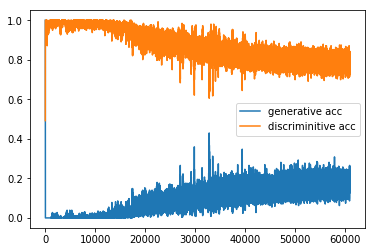

Discriminator loss:  0.35845926
Generator loss: 1.5051042


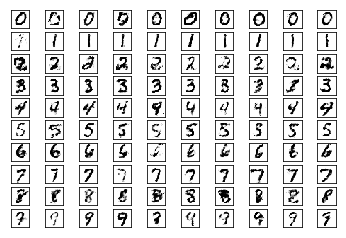


 Plot learning curves 



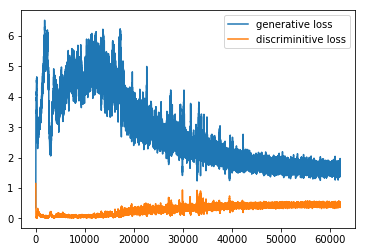


 Plot learning acc 



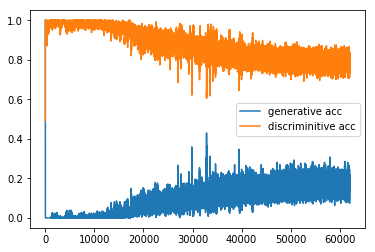

Discriminator loss:  0.46458584
Generator loss: 1.7523074


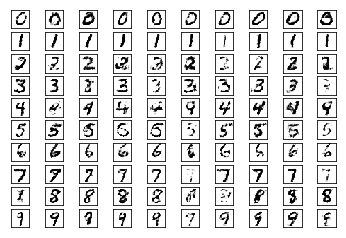


 Plot learning curves 



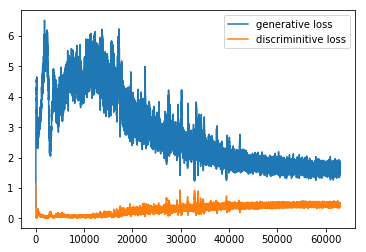


 Plot learning acc 



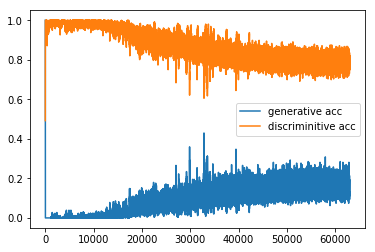

Discriminator loss:  0.47561818
Generator loss: 1.4643605


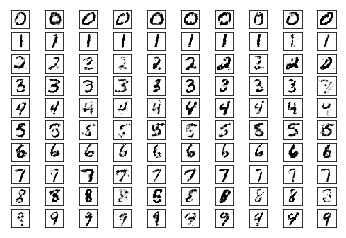


 Plot learning curves 



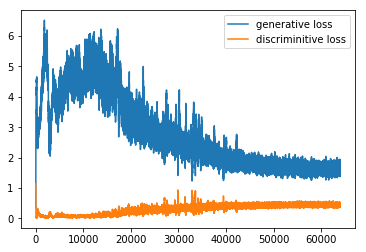


 Plot learning acc 



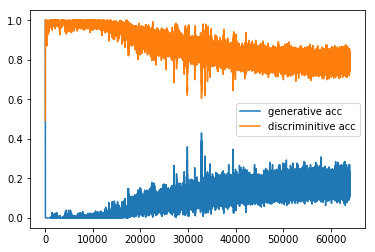

Discriminator loss:  0.4496598
Generator loss: 1.4535475


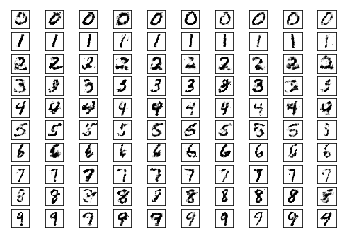


 Plot learning curves 



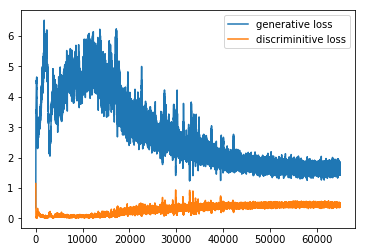


 Plot learning acc 



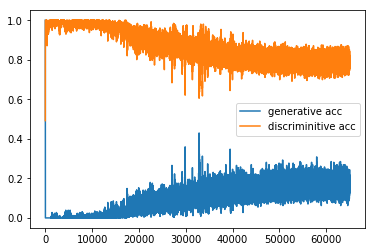

Discriminator loss:  0.43841356
Generator loss: 1.7131469


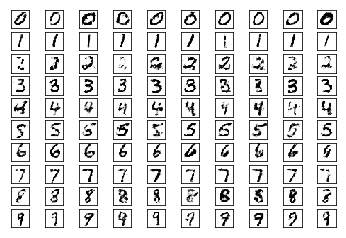


 Plot learning curves 



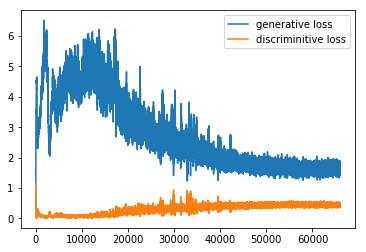


 Plot learning acc 



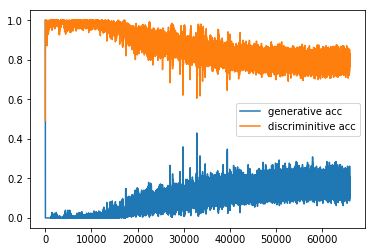

Discriminator loss:  0.41888666
Generator loss: 1.8096359


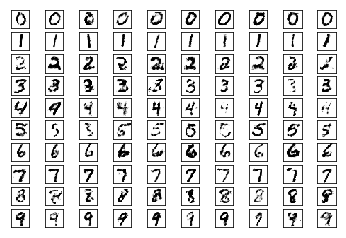


 Plot learning curves 



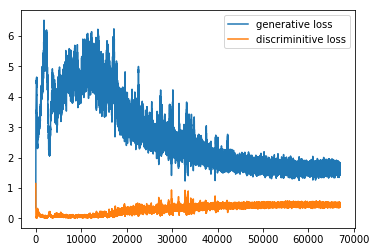


 Plot learning acc 



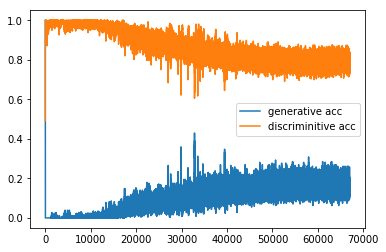

Discriminator loss:  0.40077597
Generator loss: 1.5020922


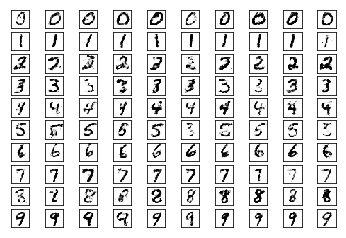


 Plot learning curves 



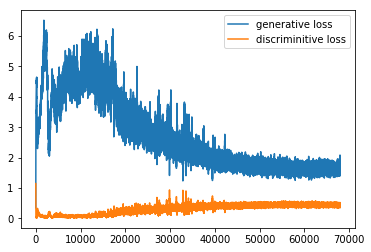


 Plot learning acc 



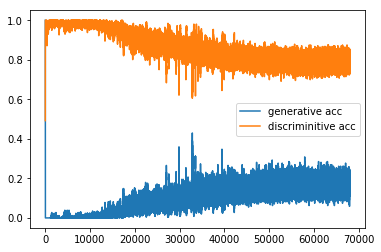

Discriminator loss:  0.47204983
Generator loss: 1.7373188


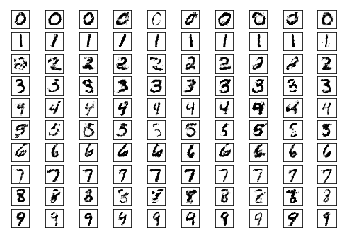


 Plot learning curves 



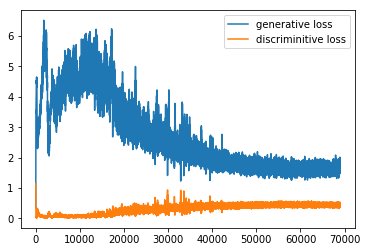


 Plot learning acc 



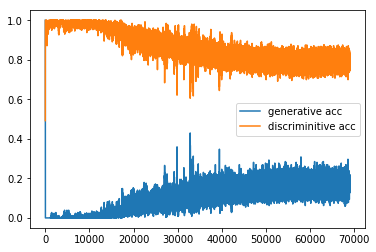

Discriminator loss:  0.45424256
Generator loss: 1.6817565


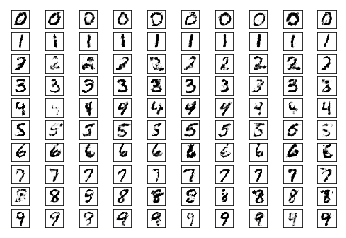


 Plot learning curves 



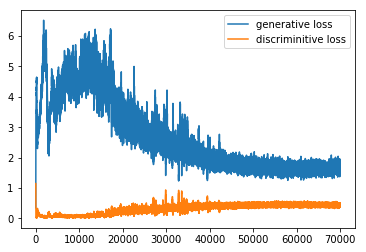


 Plot learning acc 



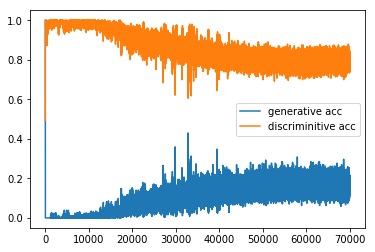

Discriminator loss:  0.43162322
Generator loss: 1.7857844


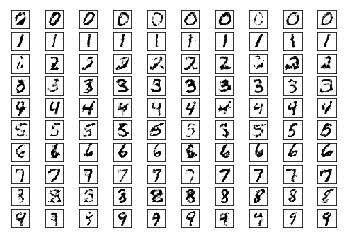


 Plot learning curves 



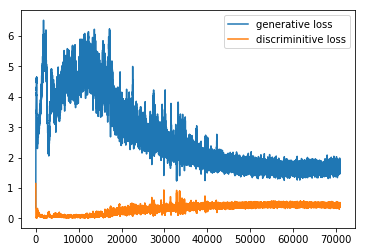


 Plot learning acc 



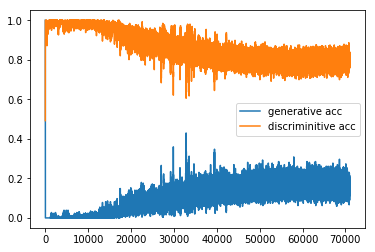

Discriminator loss:  0.4851519
Generator loss: 1.6294487


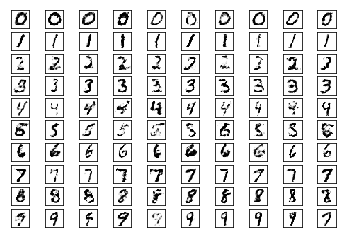


 Plot learning curves 



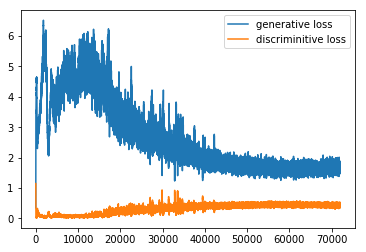


 Plot learning acc 



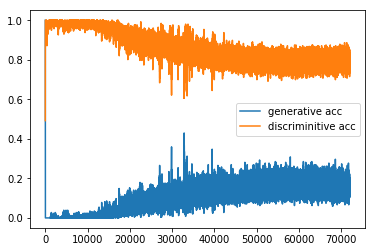

Discriminator loss:  0.4775972
Generator loss: 1.9275578


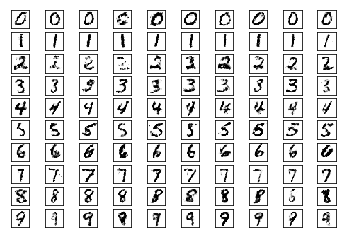


 Plot learning curves 



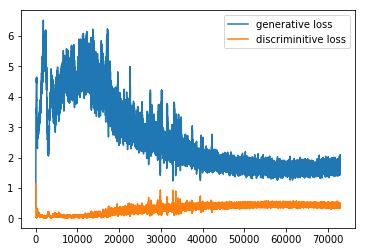


 Plot learning acc 



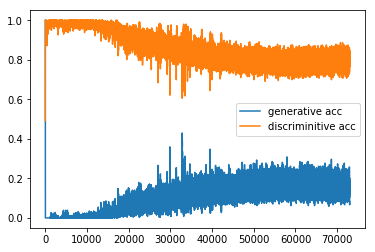

Discriminator loss:  0.40837204
Generator loss: 1.5450721


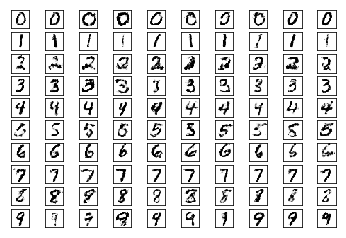


 Plot learning curves 



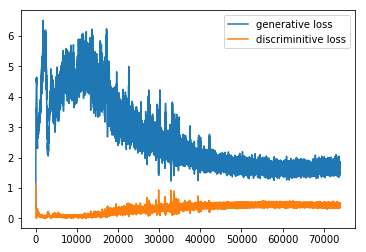


 Plot learning acc 



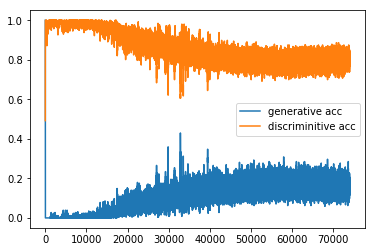

Discriminator loss:  0.39863312
Generator loss: 1.5522308


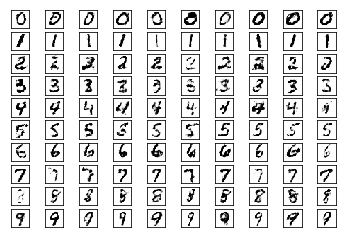


 Plot learning curves 



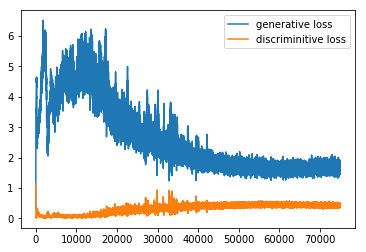


 Plot learning acc 



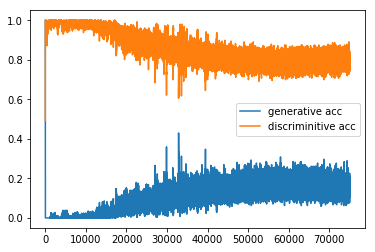

Discriminator loss:  0.44643307
Generator loss: 1.6969335


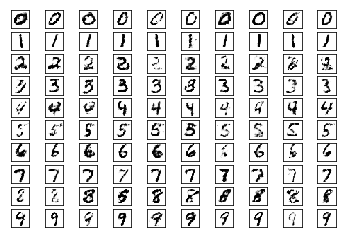


 Plot learning curves 



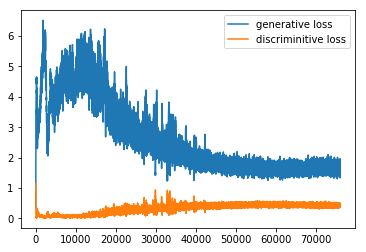


 Plot learning acc 



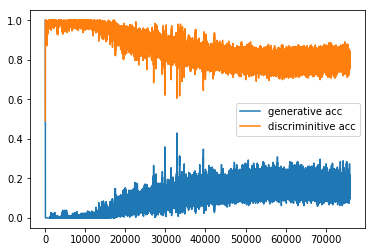

Discriminator loss:  0.46751106
Generator loss: 1.6258433


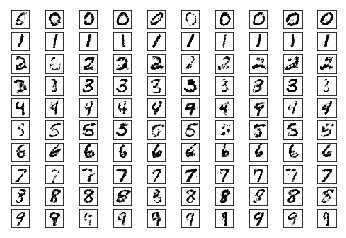


 Plot learning curves 



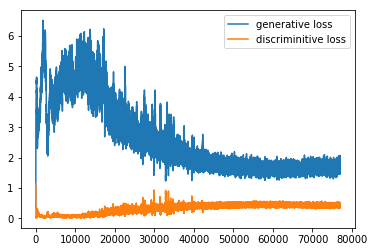


 Plot learning acc 



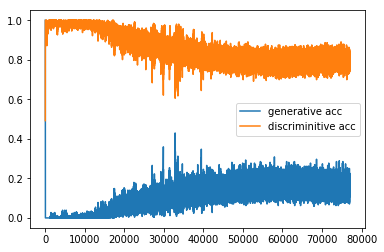

Discriminator loss:  0.39336318
Generator loss: 1.7309892


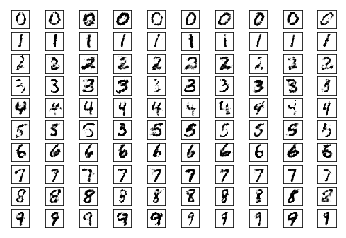


 Plot learning curves 



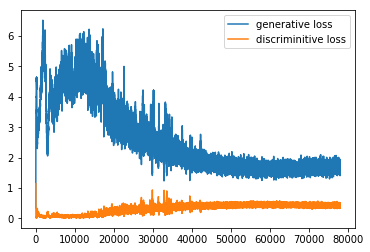


 Plot learning acc 



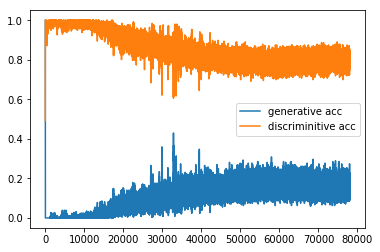

Discriminator loss:  0.41410196
Generator loss: 1.6586828


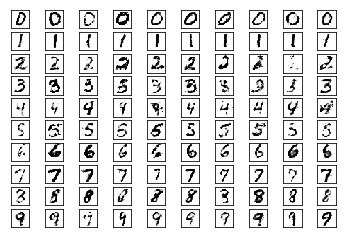


 Plot learning curves 



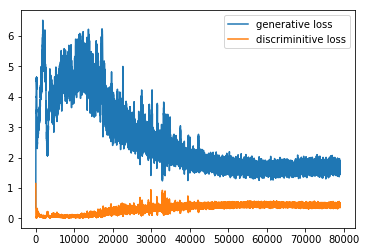


 Plot learning acc 



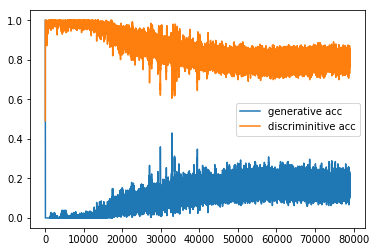

Discriminator loss:  0.39323696
Generator loss: 1.6565378


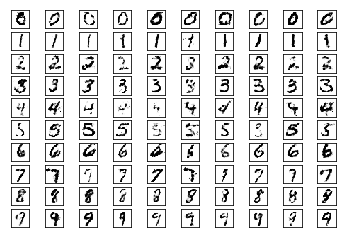


 Plot learning curves 



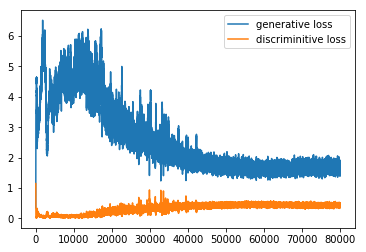


 Plot learning acc 



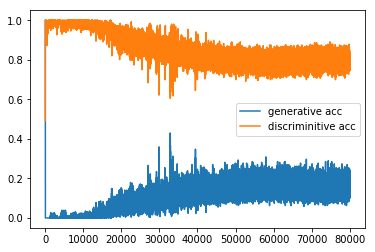

Discriminator loss:  0.5105895
Generator loss: 1.4681227


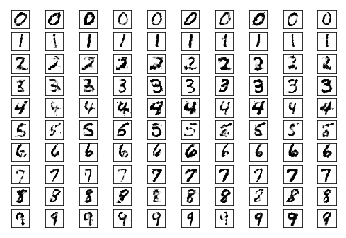


 Plot learning curves 



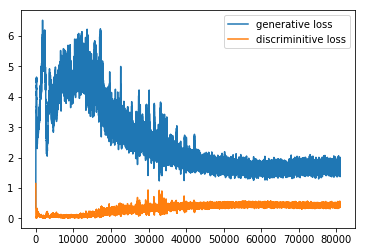


 Plot learning acc 



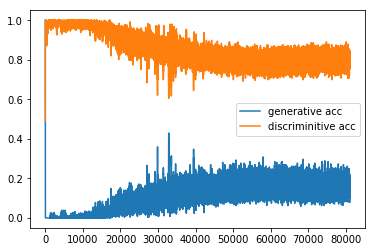

Discriminator loss:  0.35126713
Generator loss: 1.632834


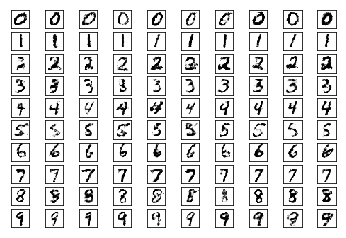


 Plot learning curves 



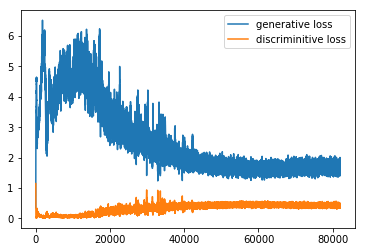


 Plot learning acc 



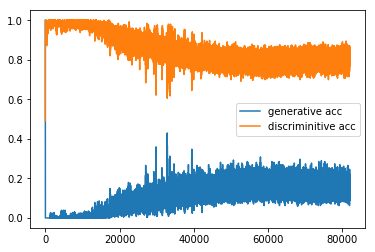

Discriminator loss:  0.42167115
Generator loss: 1.6842967


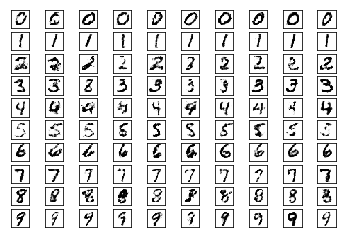


 Plot learning curves 



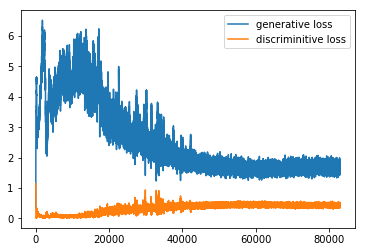


 Plot learning acc 



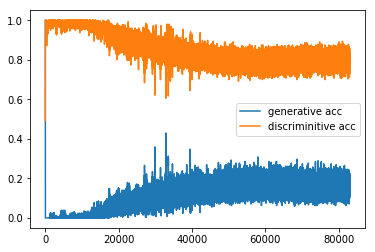

Discriminator loss:  0.41322625
Generator loss: 1.5171165


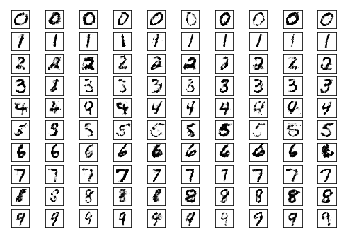


 Plot learning curves 



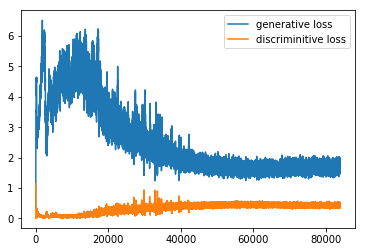


 Plot learning acc 



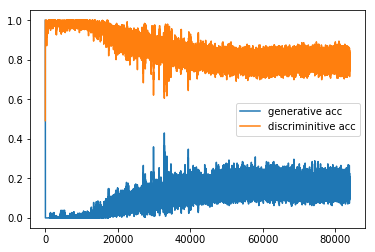

Discriminator loss:  0.3960811
Generator loss: 1.6000574


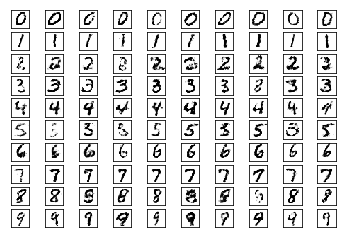


 Plot learning curves 



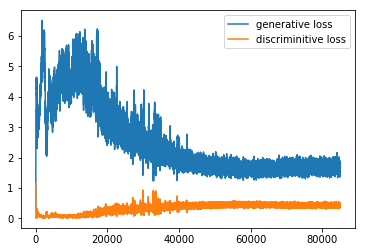


 Plot learning acc 



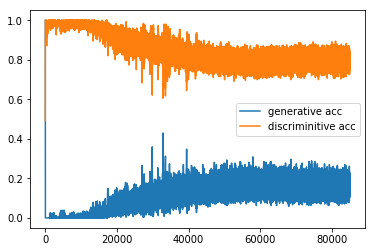

Discriminator loss:  0.45407757
Generator loss: 1.6511314


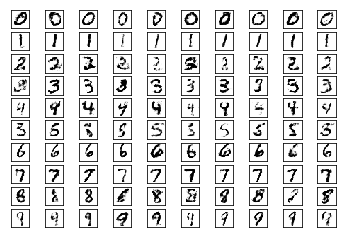


 Plot learning curves 



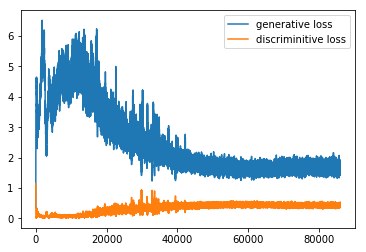


 Plot learning acc 



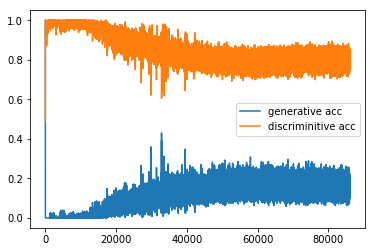

Discriminator loss:  0.38519096
Generator loss: 1.7142453


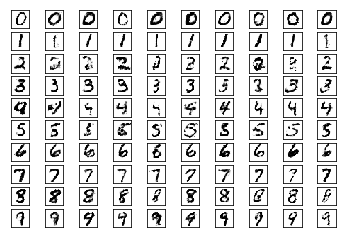


 Plot learning curves 



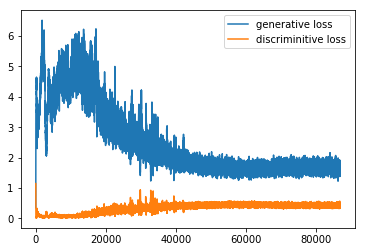


 Plot learning acc 



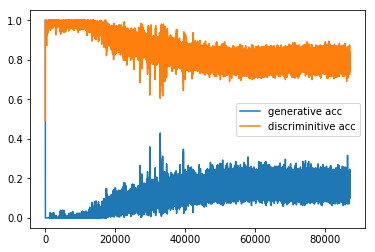

Discriminator loss:  0.44571084
Generator loss: 1.7357812


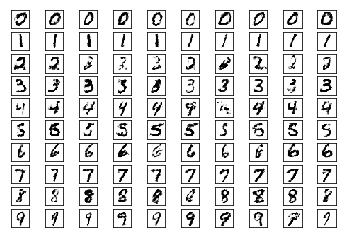


 Plot learning curves 



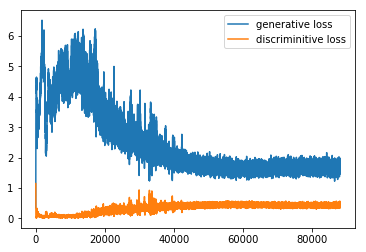


 Plot learning acc 



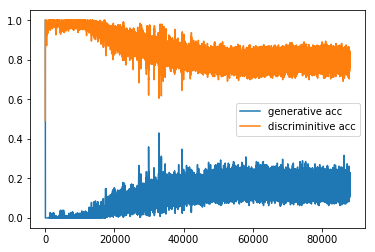

Discriminator loss:  0.42579418
Generator loss: 1.6294785


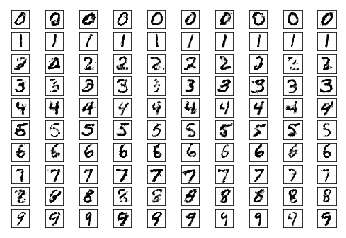


 Plot learning curves 



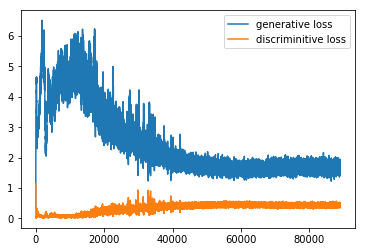


 Plot learning acc 



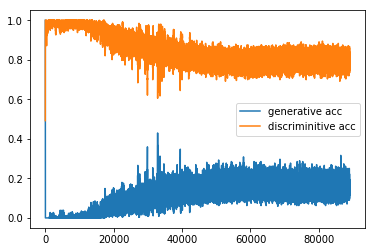

Discriminator loss:  0.4291924
Generator loss: 1.6333017


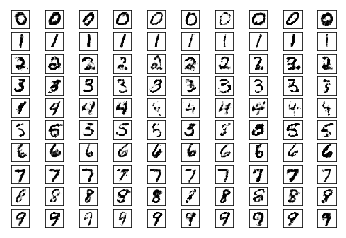


 Plot learning curves 



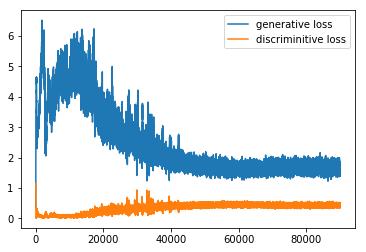


 Plot learning acc 



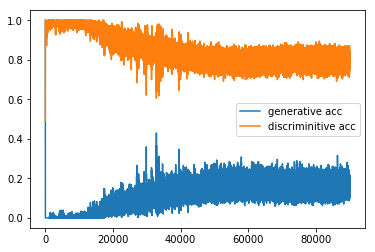

Discriminator loss:  0.4263421
Generator loss: 1.5193381


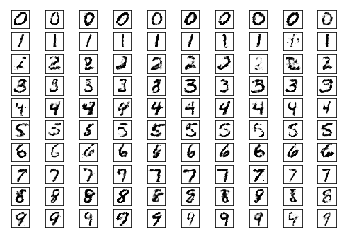


 Plot learning curves 



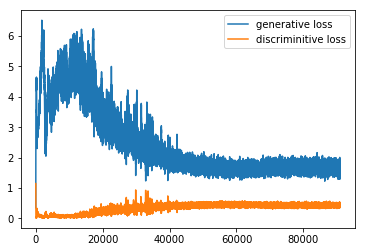


 Plot learning acc 



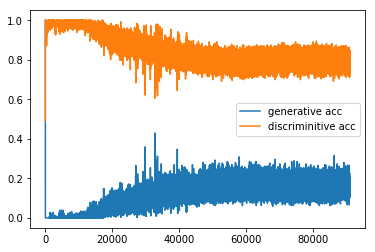

Discriminator loss:  0.39467114
Generator loss: 1.8511378


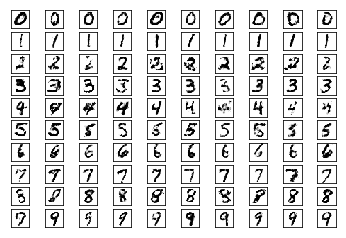


 Plot learning curves 



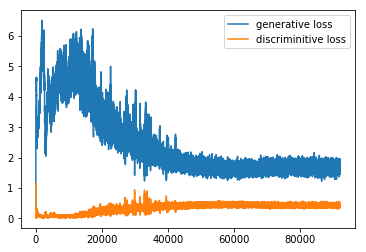


 Plot learning acc 



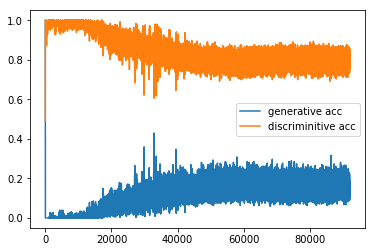

Discriminator loss:  0.444848
Generator loss: 1.7032509


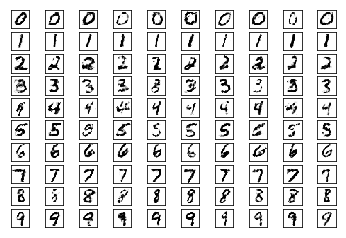


 Plot learning curves 



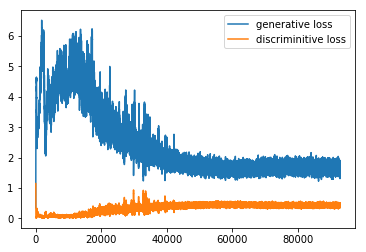


 Plot learning acc 



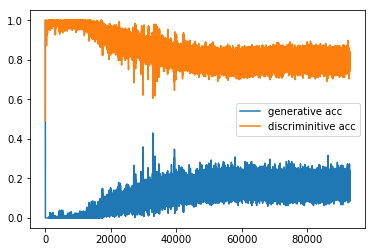

Discriminator loss:  0.41561925
Generator loss: 1.8626456


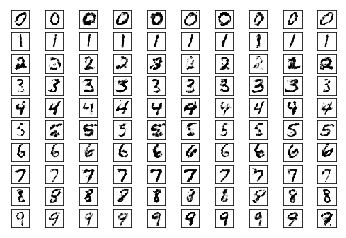


 Plot learning curves 



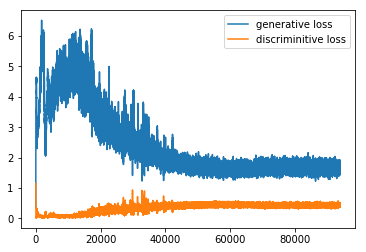


 Plot learning acc 



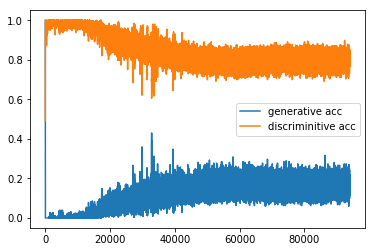

Discriminator loss:  0.43137372
Generator loss: 1.6112726


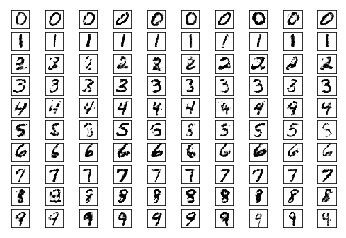


 Plot learning curves 



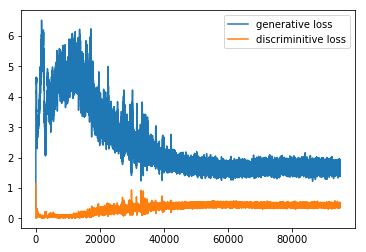


 Plot learning acc 



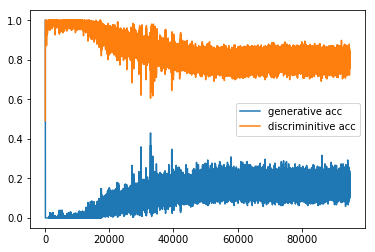

Discriminator loss:  0.41800505
Generator loss: 1.7133509


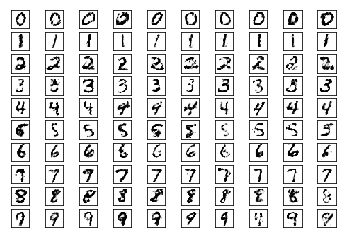


 Plot learning curves 



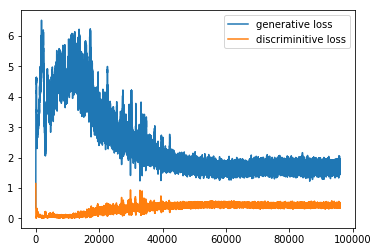


 Plot learning acc 



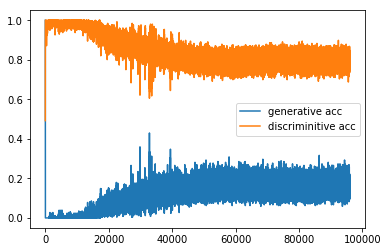

Discriminator loss:  0.41783577
Generator loss: 1.6304872


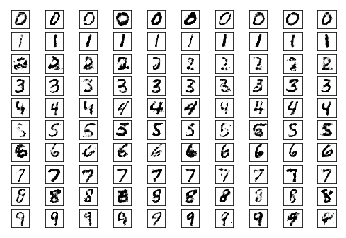


 Plot learning curves 



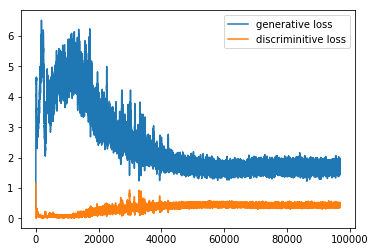


 Plot learning acc 



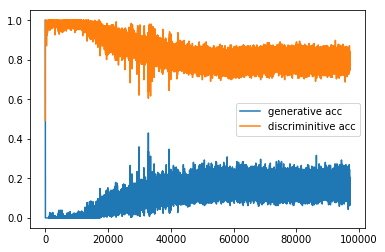

Discriminator loss:  0.47330675
Generator loss: 1.619403


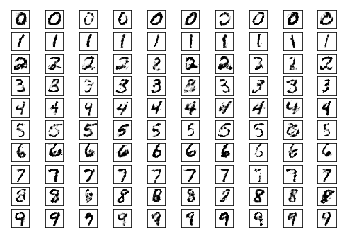


 Plot learning curves 



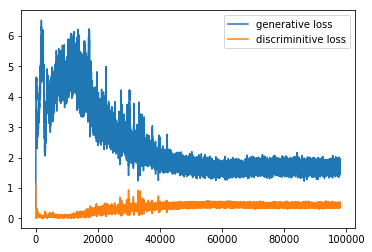


 Plot learning acc 



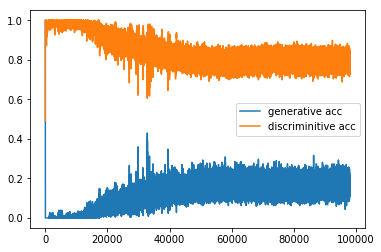

Discriminator loss:  0.37601537
Generator loss: 1.6140444


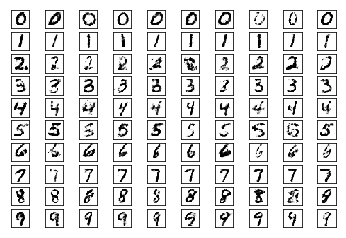


 Plot learning curves 



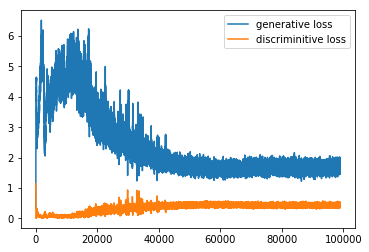


 Plot learning acc 



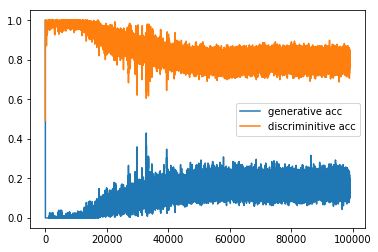

Discriminator loss:  0.44670963
Generator loss: 1.5714569


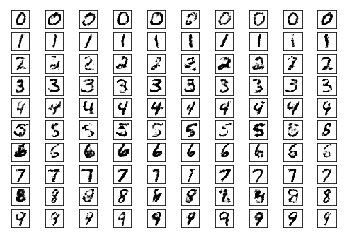


 Plot learning curves 



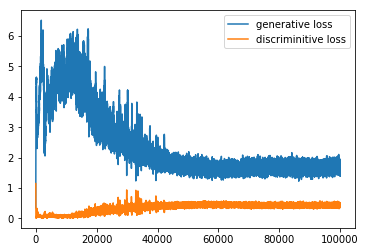


 Plot learning acc 



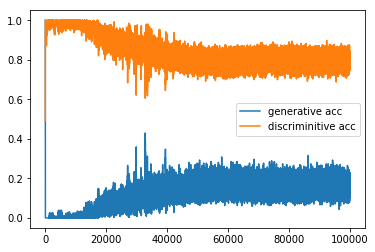

Discriminator loss:  0.37194288
Generator loss: 1.7783196


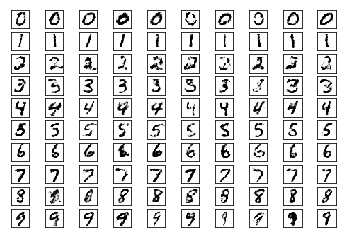


 Plot learning curves 



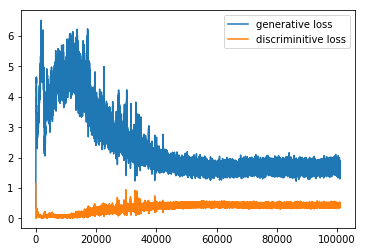


 Plot learning acc 



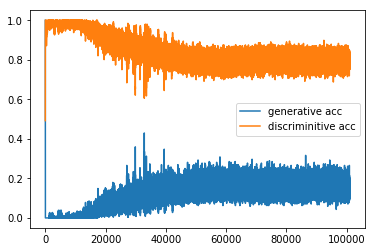

Discriminator loss:  0.45517734
Generator loss: 1.6252553


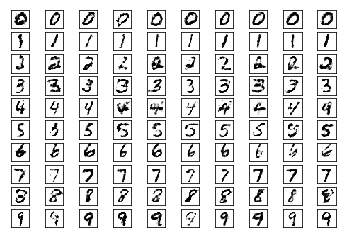


 Plot learning curves 



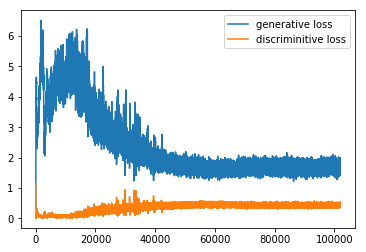


 Plot learning acc 



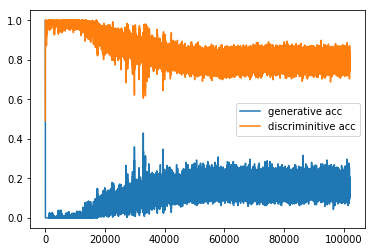

Discriminator loss:  0.40401626
Generator loss: 1.6401842


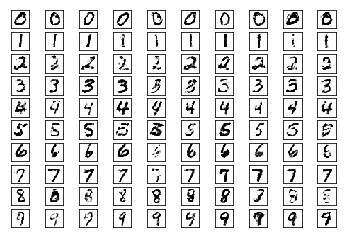


 Plot learning curves 



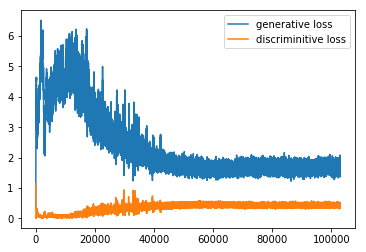


 Plot learning acc 



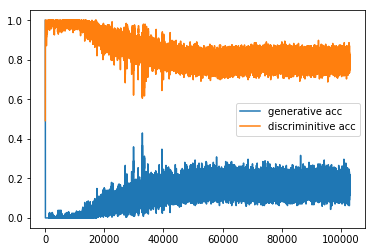

Discriminator loss:  0.46200907
Generator loss: 1.7179335


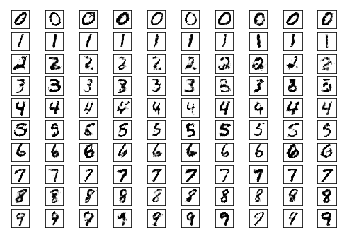


 Plot learning curves 



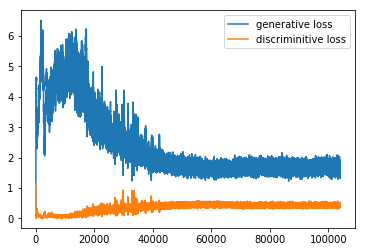


 Plot learning acc 



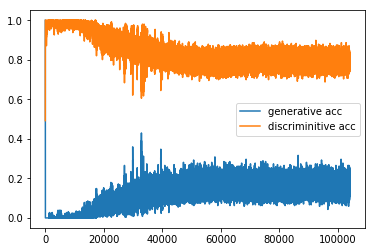

Discriminator loss:  0.47206312
Generator loss: 1.7792469


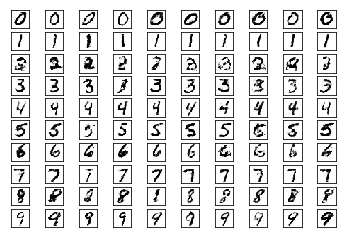


 Plot learning curves 



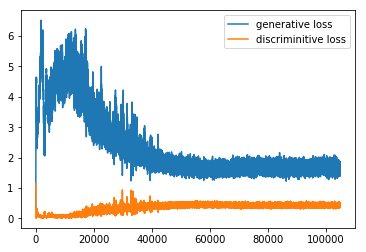


 Plot learning acc 



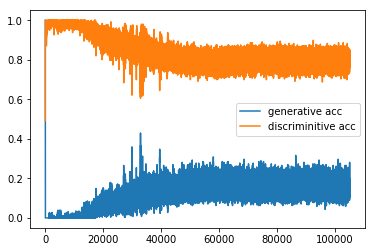

Discriminator loss:  0.4062066
Generator loss: 1.7761084


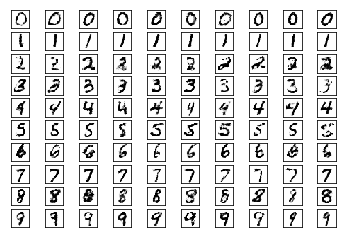


 Plot learning curves 



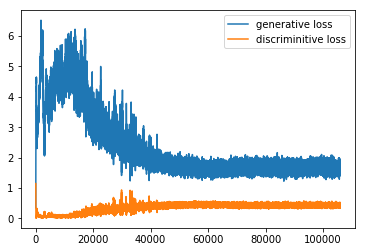


 Plot learning acc 



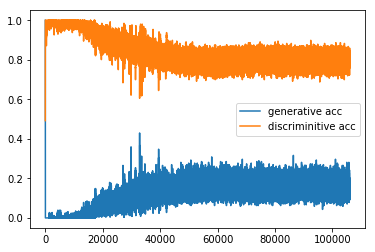

Discriminator loss:  0.43935284
Generator loss: 1.5754563


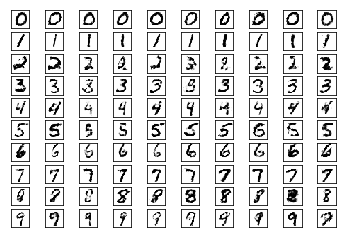


 Plot learning curves 



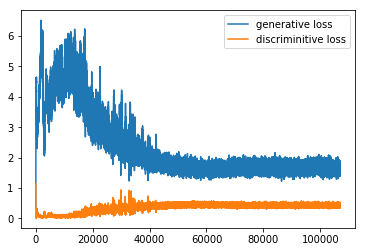


 Plot learning acc 



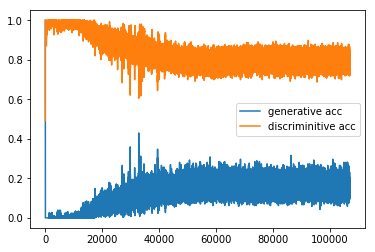

Discriminator loss:  0.39966193
Generator loss: 1.7507792


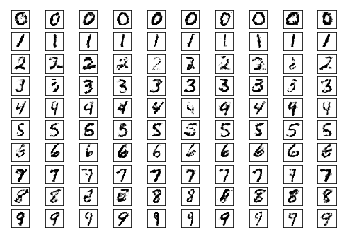


 Plot learning curves 



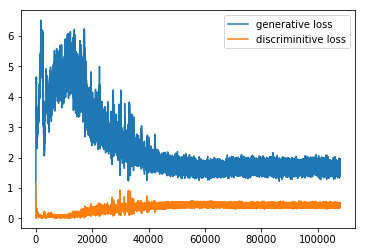


 Plot learning acc 



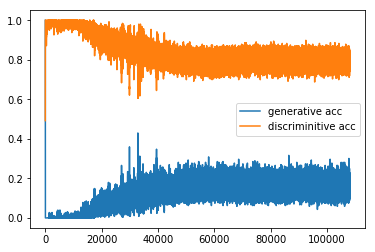

Discriminator loss:  0.44466636
Generator loss: 1.3214369


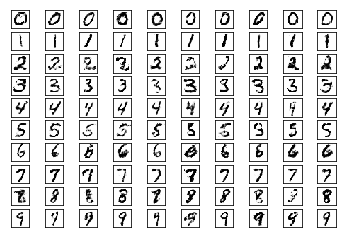


 Plot learning curves 



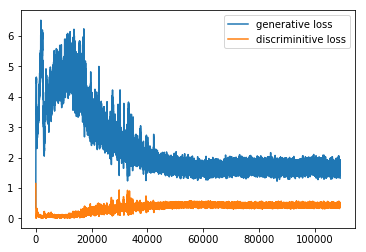


 Plot learning acc 



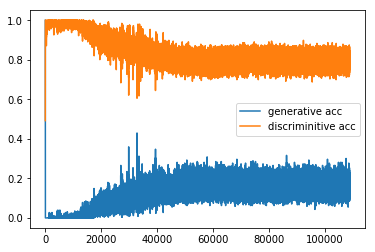

Discriminator loss:  0.41875637
Generator loss: 1.6041992


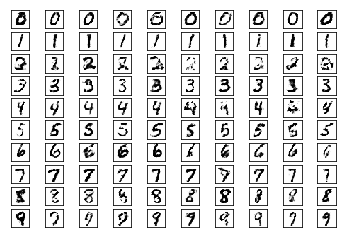


 Plot learning curves 



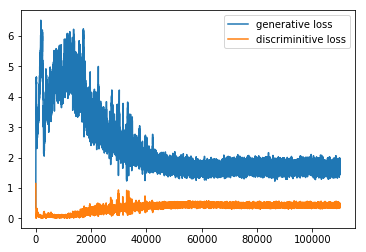


 Plot learning acc 



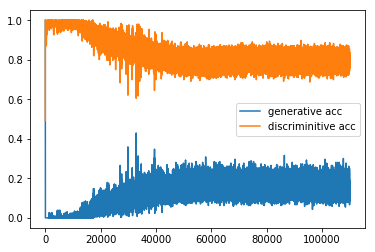

Discriminator loss:  0.42244932
Generator loss: 1.4855455


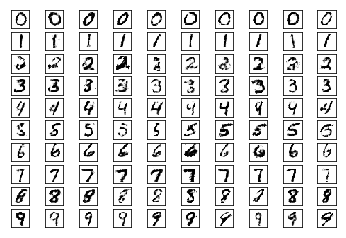


 Plot learning curves 



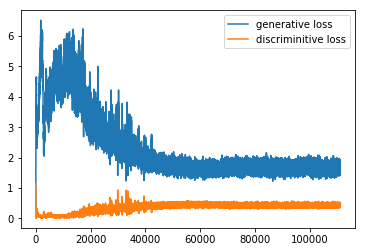


 Plot learning acc 



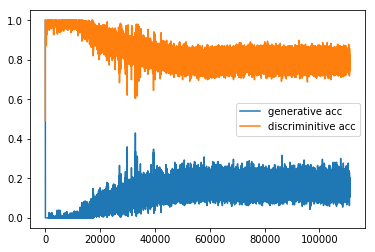

Discriminator loss:  0.40965143
Generator loss: 1.5623554


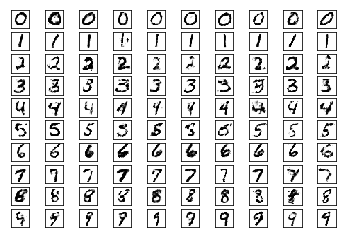


 Plot learning curves 



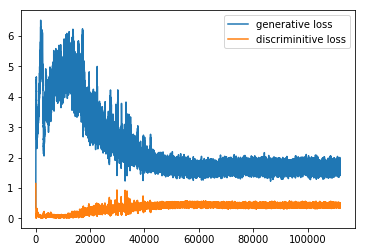


 Plot learning acc 



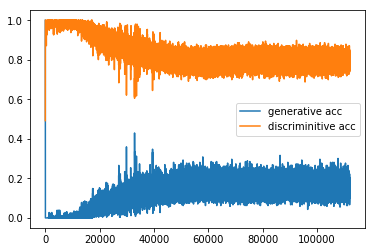

Discriminator loss:  0.40936738
Generator loss: 1.7382766


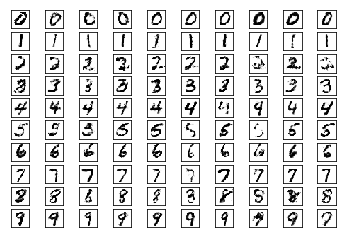


 Plot learning curves 



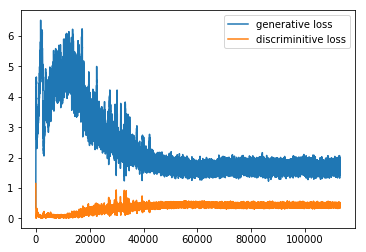


 Plot learning acc 



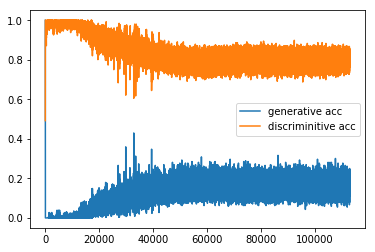

Discriminator loss:  0.3838434
Generator loss: 1.5810919


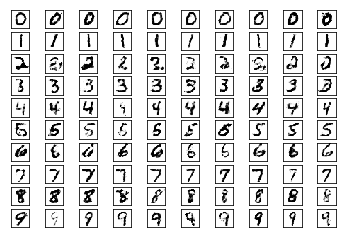


 Plot learning curves 



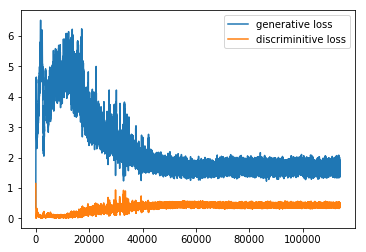


 Plot learning acc 



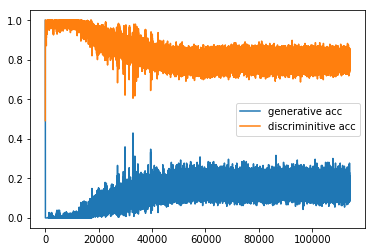

Discriminator loss:  0.44899493
Generator loss: 1.7271026


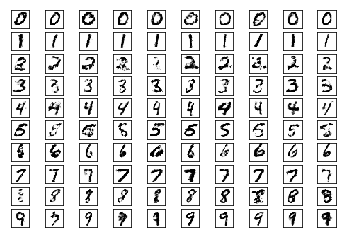


 Plot learning curves 



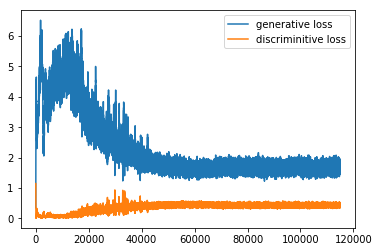


 Plot learning acc 



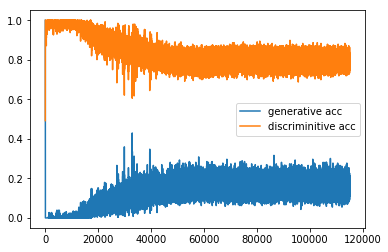

Discriminator loss:  0.37034342
Generator loss: 1.5781399


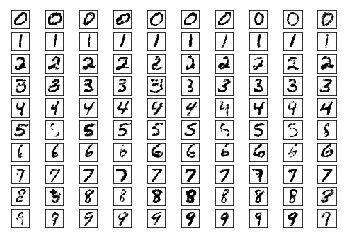


 Plot learning curves 



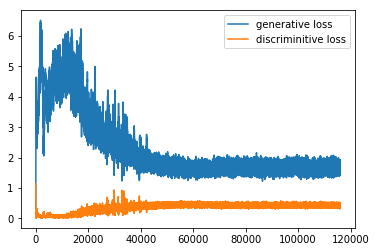


 Plot learning acc 



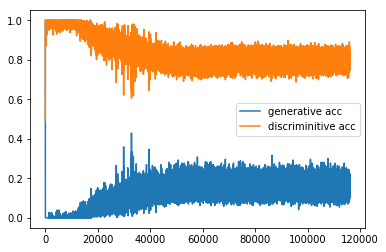

Discriminator loss:  0.4424137
Generator loss: 1.6554086


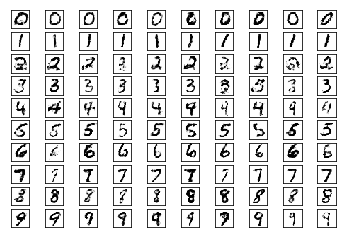


 Plot learning curves 



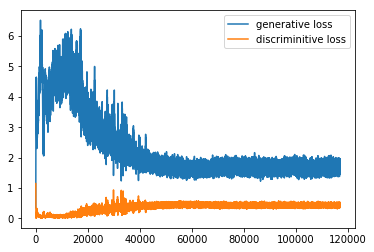


 Plot learning acc 



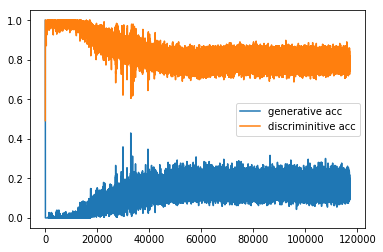

Discriminator loss:  0.40013522
Generator loss: 1.622163


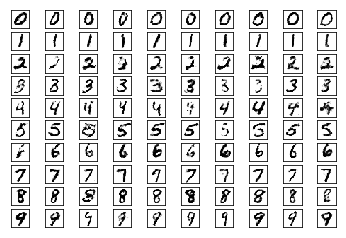


 Plot learning curves 



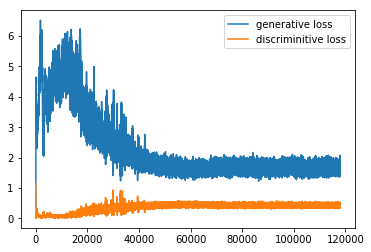


 Plot learning acc 



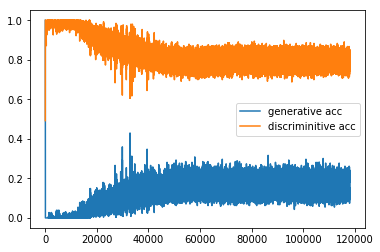

Discriminator loss:  0.47327292
Generator loss: 1.7131164


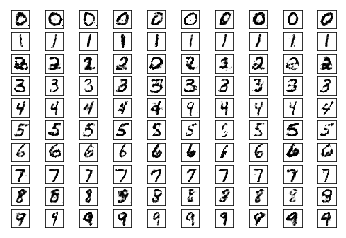


 Plot learning curves 



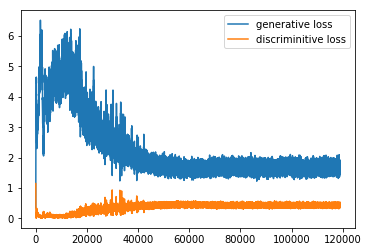


 Plot learning acc 



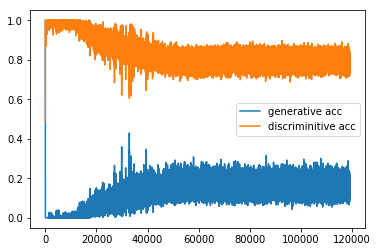

Discriminator loss:  0.43934798
Generator loss: 1.5871319


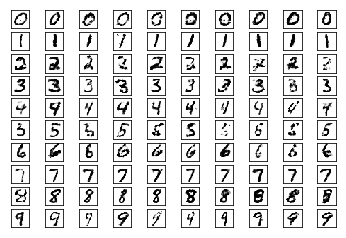


 Plot learning curves 



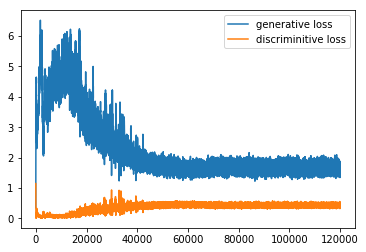


 Plot learning acc 



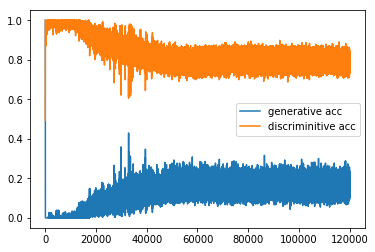

Discriminator loss:  0.42158413
Generator loss: 1.6936105


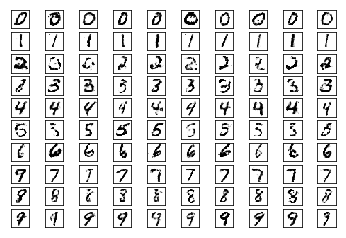


 Plot learning curves 



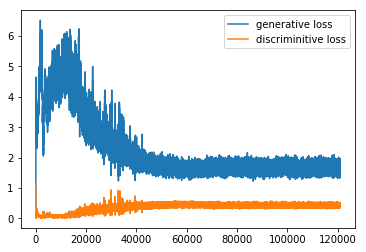


 Plot learning acc 



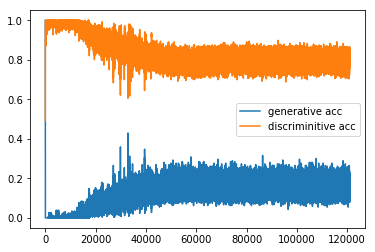

Discriminator loss:  0.3969593
Generator loss: 1.7474706


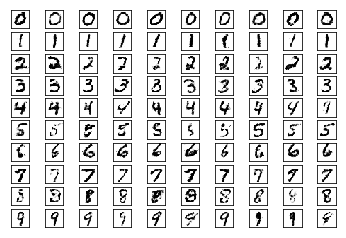


 Plot learning curves 



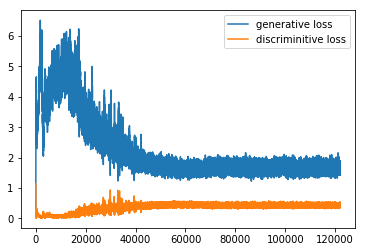


 Plot learning acc 



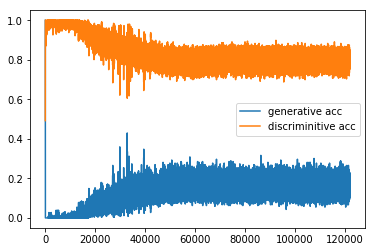

Discriminator loss:  0.45777816
Generator loss: 1.7123435


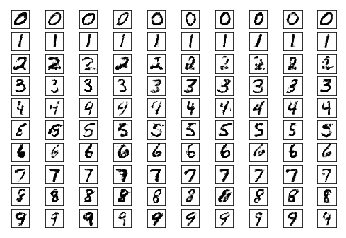


 Plot learning curves 



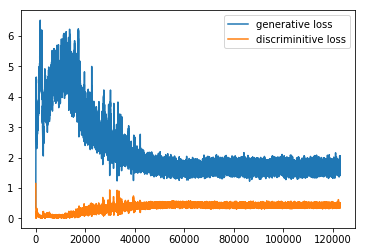


 Plot learning acc 



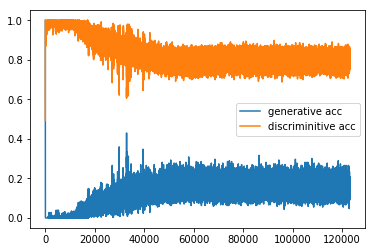

Discriminator loss:  0.42833468
Generator loss: 1.6200361


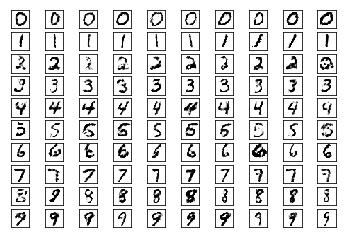


 Plot learning curves 



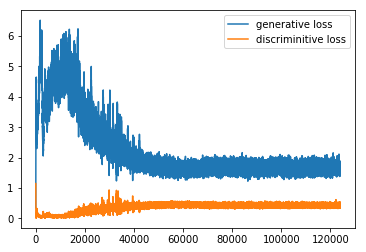


 Plot learning acc 



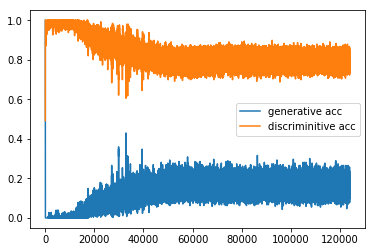

Discriminator loss:  0.4561391
Generator loss: 1.7376056


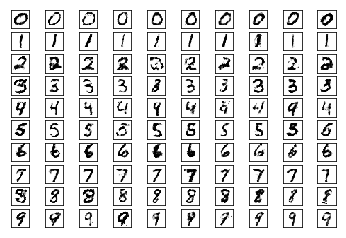


 Plot learning curves 



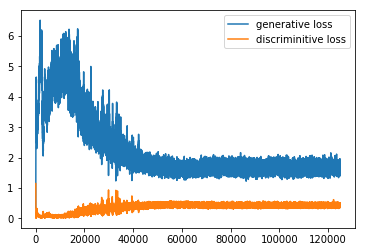


 Plot learning acc 



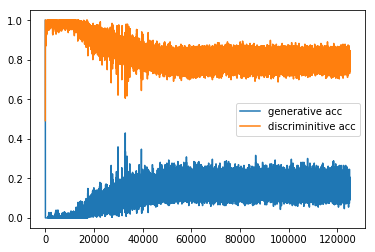

Discriminator loss:  0.3983725
Generator loss: 1.6972289


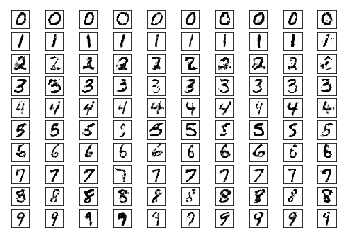


 Plot learning curves 



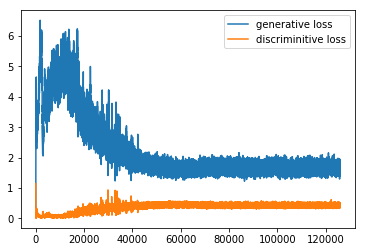


 Plot learning acc 



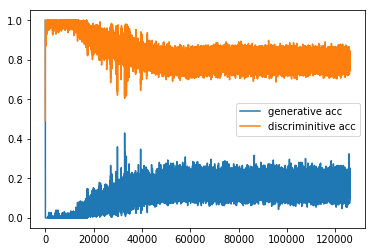

Discriminator loss:  0.4312303
Generator loss: 1.6787026


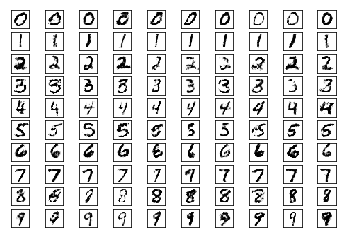


 Plot learning curves 



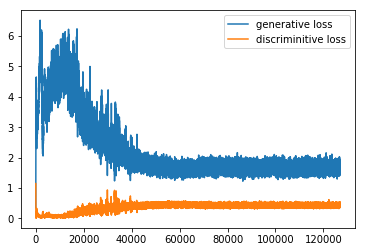


 Plot learning acc 



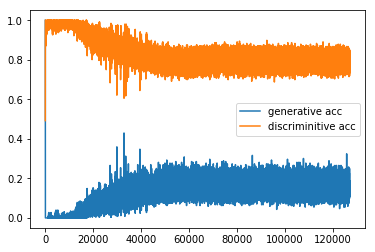

Discriminator loss:  0.38727382
Generator loss: 1.6537479


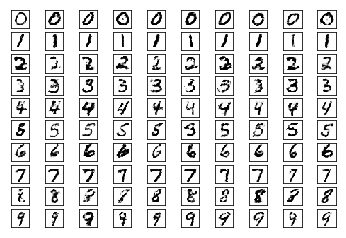


 Plot learning curves 



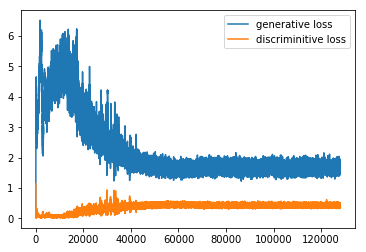


 Plot learning acc 



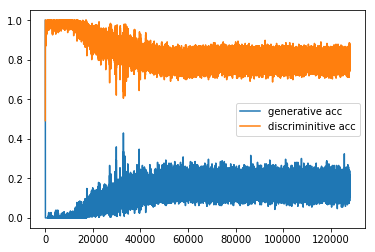

Discriminator loss:  0.41695094
Generator loss: 1.6334841


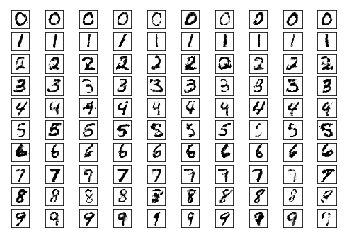


 Plot learning curves 



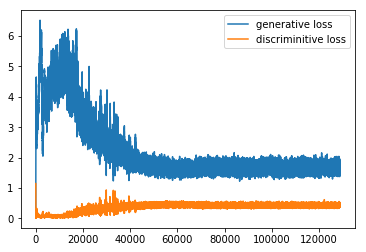


 Plot learning acc 



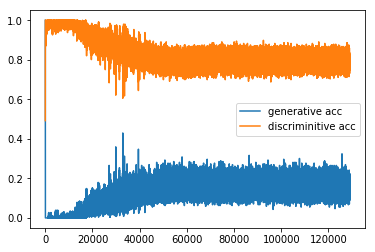

Discriminator loss:  0.40301305
Generator loss: 1.6814771


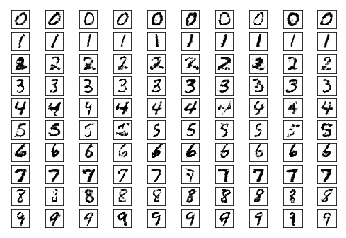


 Plot learning curves 



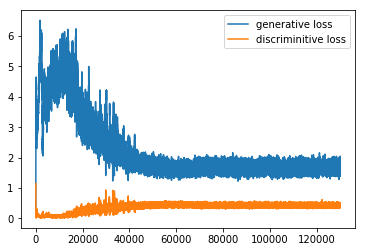


 Plot learning acc 



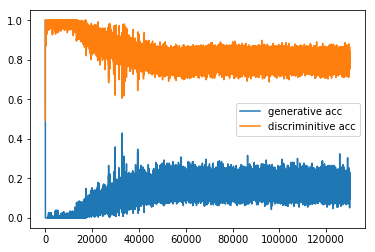

Discriminator loss:  0.46482798
Generator loss: 1.5706686


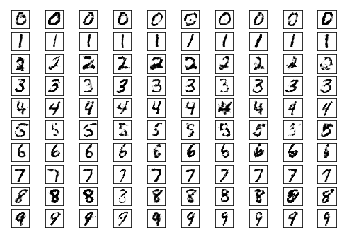


 Plot learning curves 



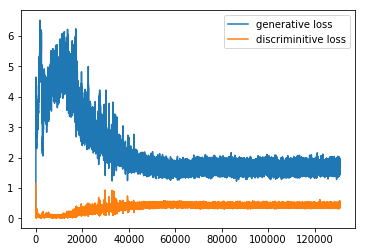


 Plot learning acc 



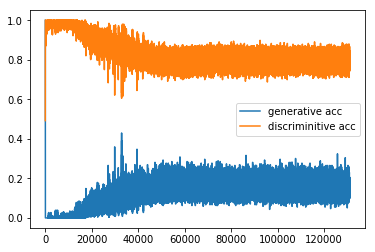

Discriminator loss:  0.46266904
Generator loss: 1.9259582


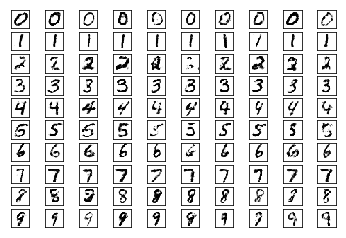


 Plot learning curves 



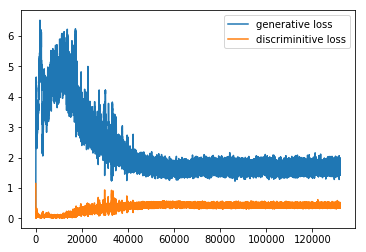


 Plot learning acc 



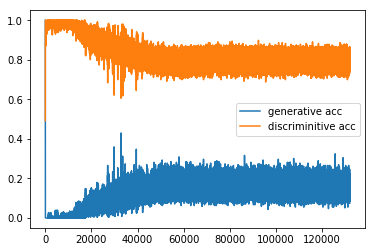

Discriminator loss:  0.42144728
Generator loss: 1.5841136


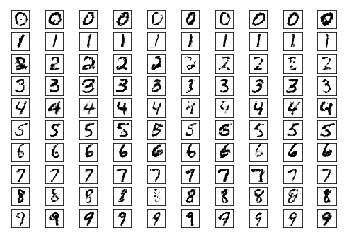


 Plot learning curves 



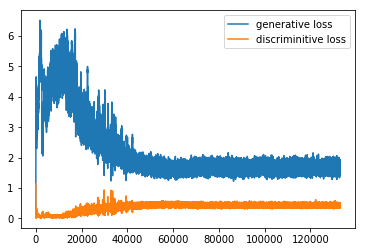


 Plot learning acc 



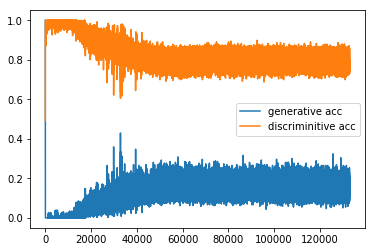

Discriminator loss:  0.4486919
Generator loss: 1.6035256


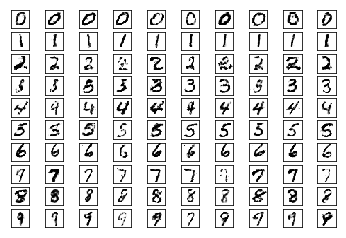


 Plot learning curves 



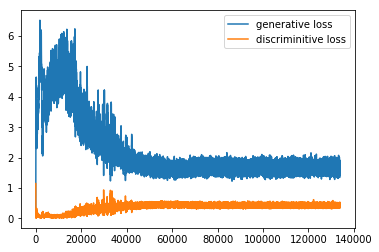


 Plot learning acc 



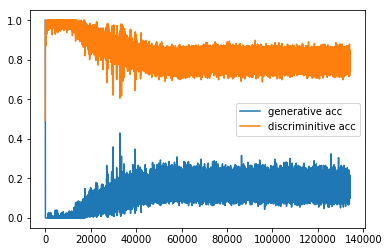

Discriminator loss:  0.46980673
Generator loss: 1.5859082


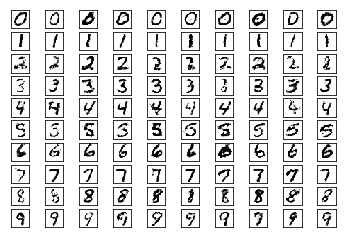


 Plot learning curves 



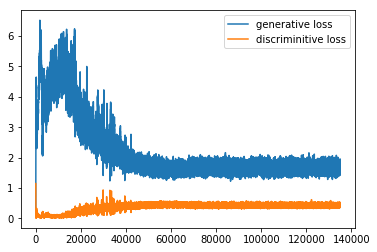


 Plot learning acc 



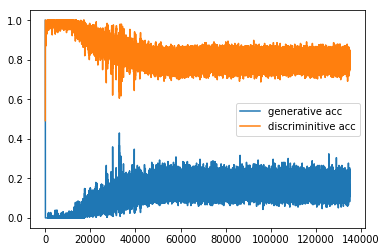

Discriminator loss:  0.3899689
Generator loss: 1.5756675


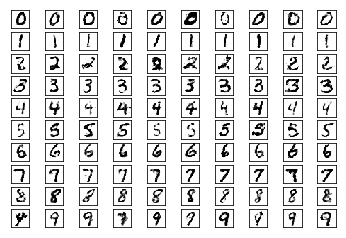


 Plot learning curves 



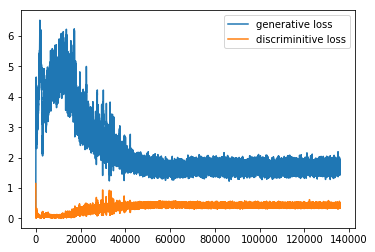


 Plot learning acc 



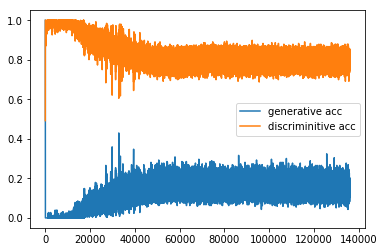

Discriminator loss:  0.42971453
Generator loss: 1.6868832


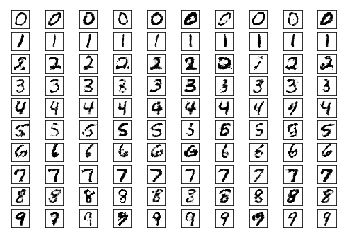


 Plot learning curves 



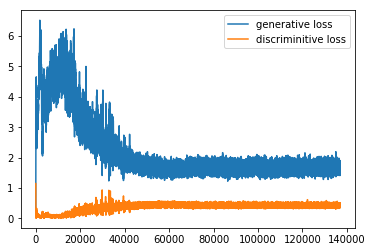


 Plot learning acc 



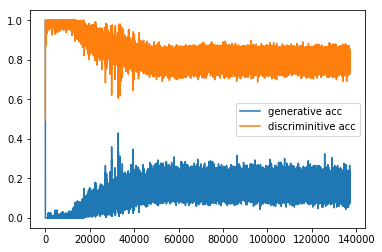

Discriminator loss:  0.45109543
Generator loss: 1.6421826


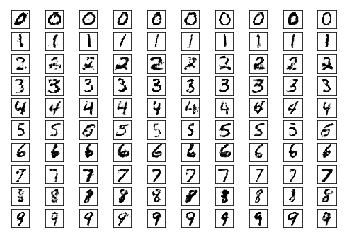


 Plot learning curves 



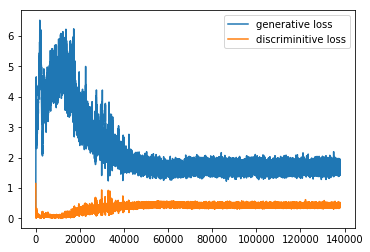


 Plot learning acc 



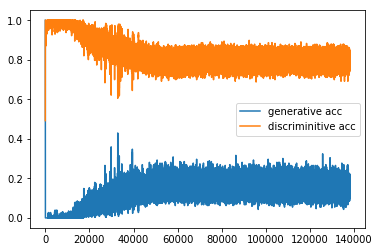

Discriminator loss:  0.4291845
Generator loss: 1.6848578


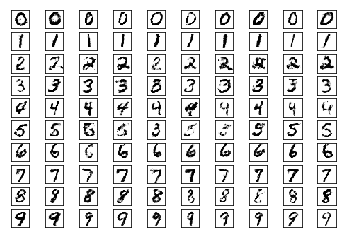


 Plot learning curves 



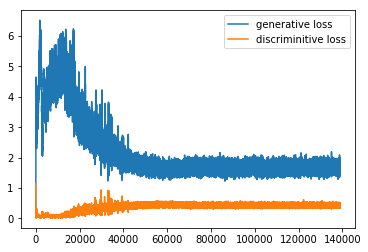


 Plot learning acc 



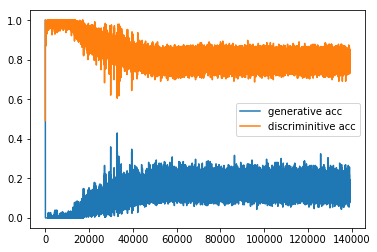

Discriminator loss:  0.4510299
Generator loss: 1.5909109


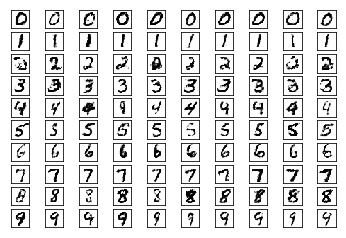


 Plot learning curves 



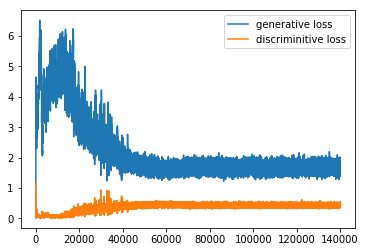


 Plot learning acc 



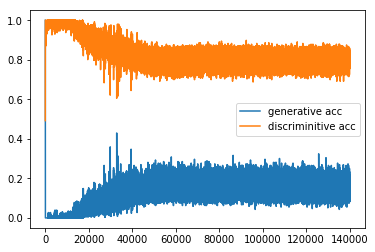

Discriminator loss:  0.4140515
Generator loss: 1.7066361


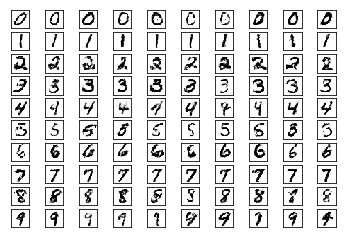


 Plot learning curves 



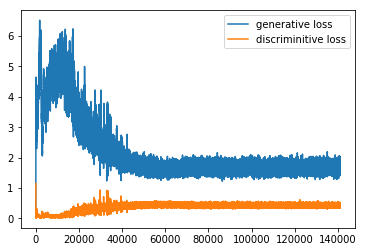


 Plot learning acc 



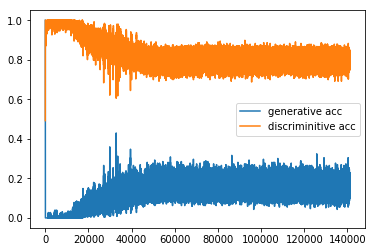

Discriminator loss:  0.4356082
Generator loss: 1.5381651


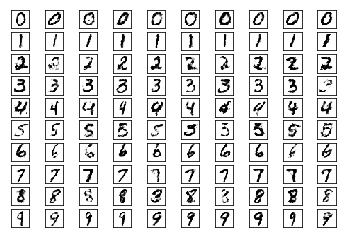


 Plot learning curves 



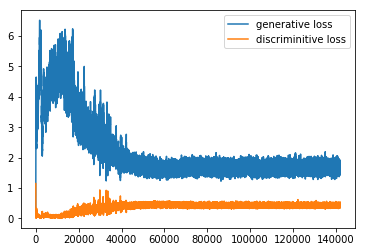


 Plot learning acc 



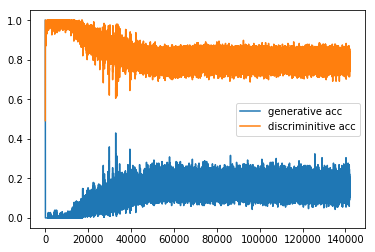

Discriminator loss:  0.4402671
Generator loss: 1.7768979


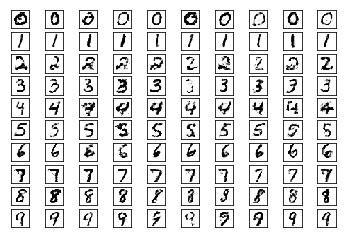


 Plot learning curves 



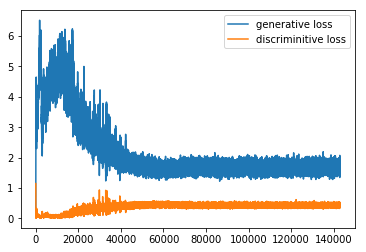


 Plot learning acc 



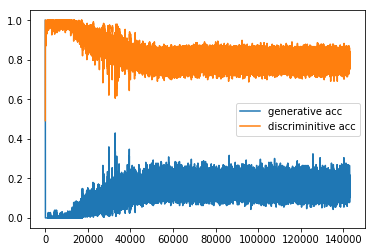

Discriminator loss:  0.38797957
Generator loss: 1.5868402


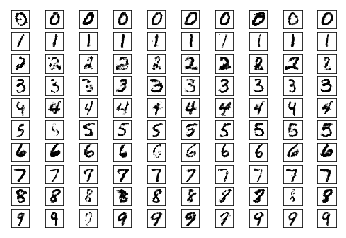


 Plot learning curves 



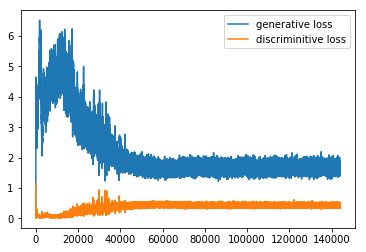


 Plot learning acc 



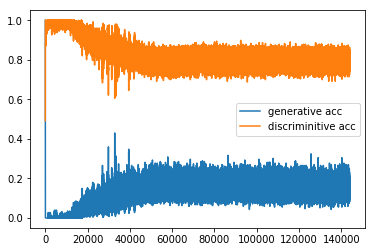

Discriminator loss:  0.46635908
Generator loss: 1.649704


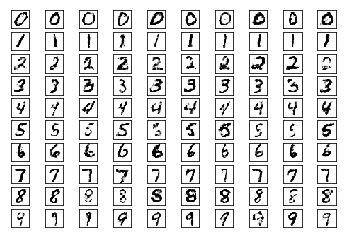


 Plot learning curves 



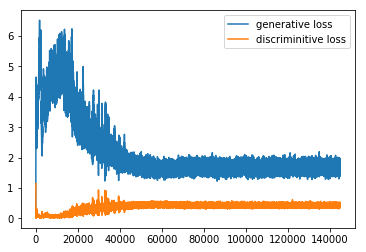


 Plot learning acc 



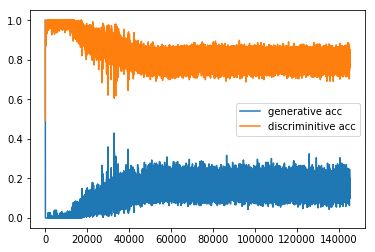

Discriminator loss:  0.41255325
Generator loss: 1.68676


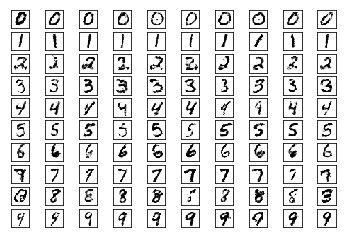


 Plot learning curves 



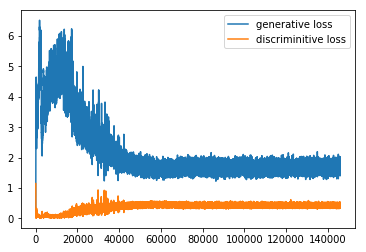


 Plot learning acc 



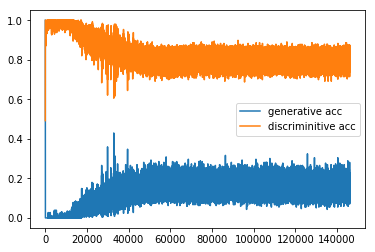

Discriminator loss:  0.40724927
Generator loss: 1.6586714


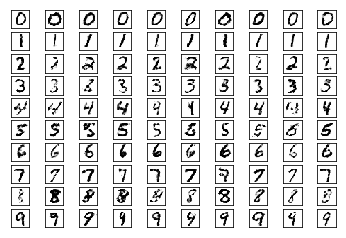


 Plot learning curves 



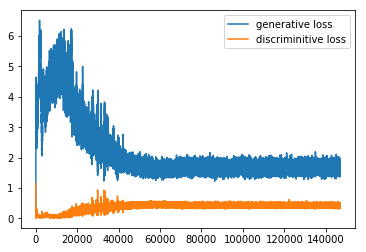


 Plot learning acc 



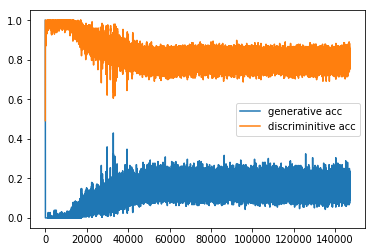

Discriminator loss:  0.42918795
Generator loss: 1.5684717


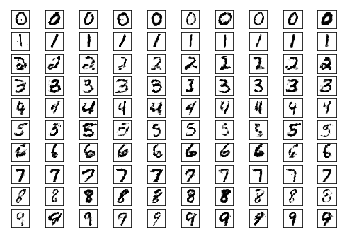


 Plot learning curves 



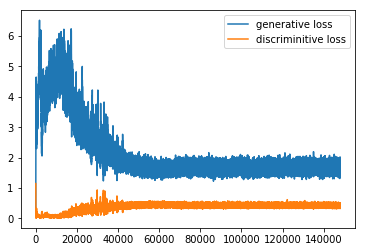


 Plot learning acc 



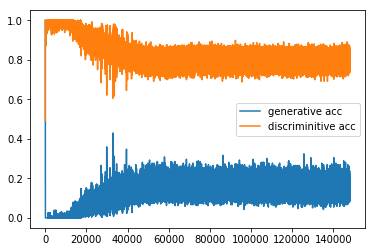

Discriminator loss:  0.43127686
Generator loss: 1.6235099


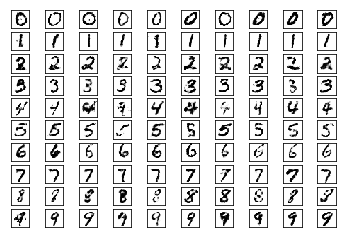


 Plot learning curves 



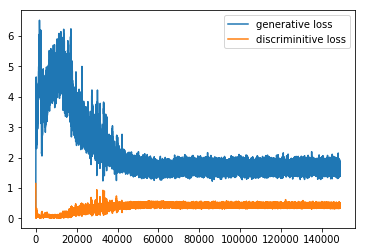


 Plot learning acc 



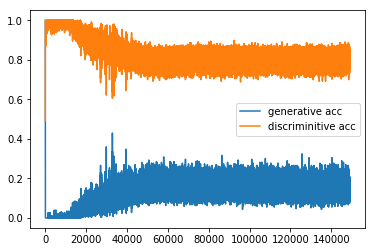

Discriminator loss:  0.43584204
Generator loss: 1.6240795


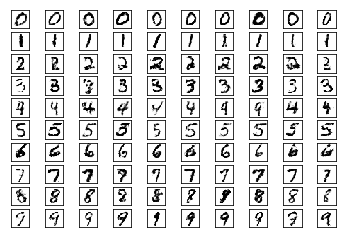


 Plot learning curves 



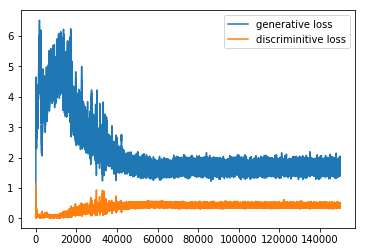


 Plot learning acc 



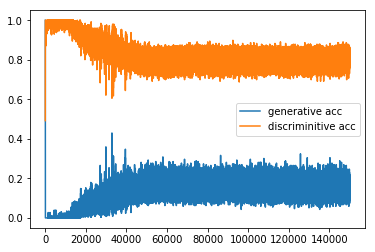

Discriminator loss:  0.4154353
Generator loss: 1.6123397


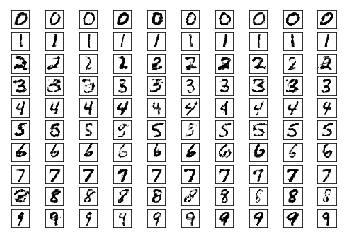


 Plot learning curves 



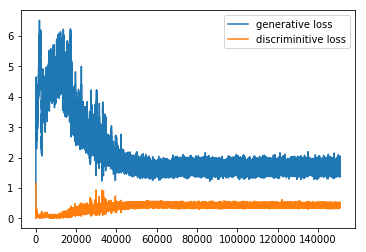


 Plot learning acc 



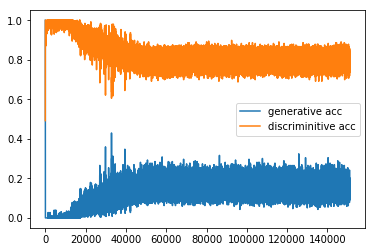

Discriminator loss:  0.46144465
Generator loss: 1.75912


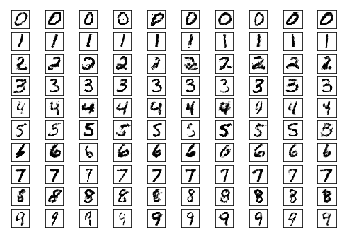


 Plot learning curves 



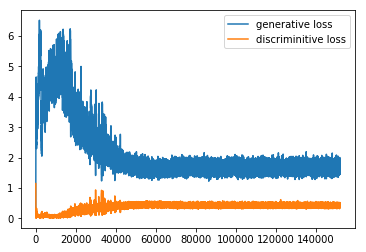


 Plot learning acc 



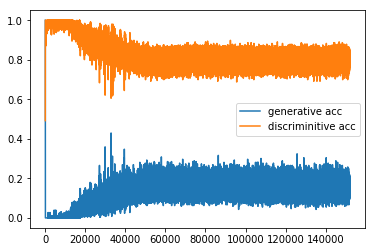

Discriminator loss:  0.42574394
Generator loss: 1.6225201


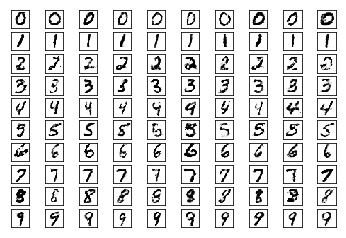


 Plot learning curves 



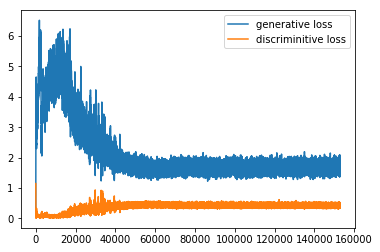


 Plot learning acc 



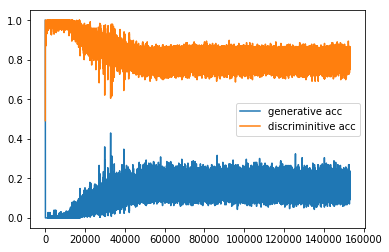

Discriminator loss:  0.44190276
Generator loss: 1.71404


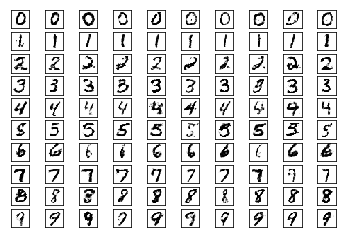


 Plot learning curves 



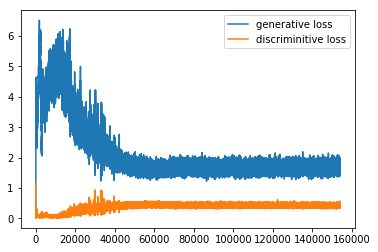


 Plot learning acc 



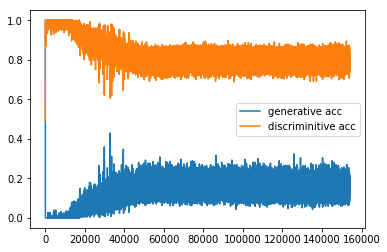

Discriminator loss:  0.4716276
Generator loss: 1.6158723


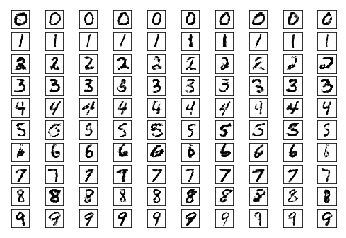


 Plot learning curves 



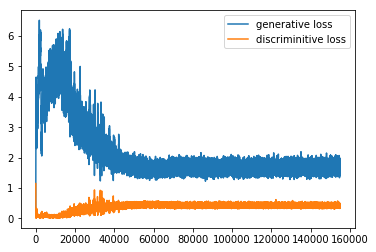


 Plot learning acc 



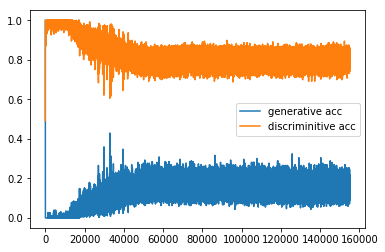

Discriminator loss:  0.4822471
Generator loss: 1.6399807


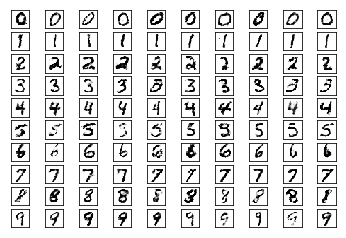


 Plot learning curves 



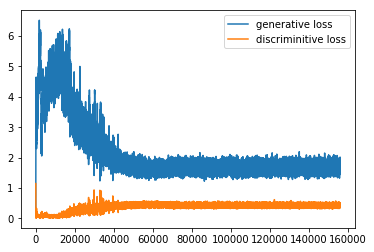


 Plot learning acc 



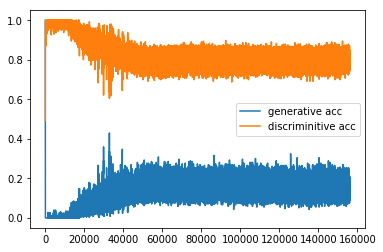

Discriminator loss:  0.381927
Generator loss: 1.6059735


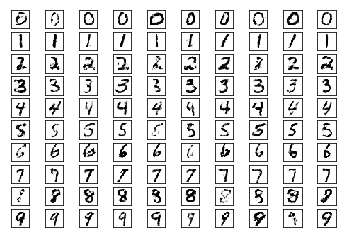


 Plot learning curves 



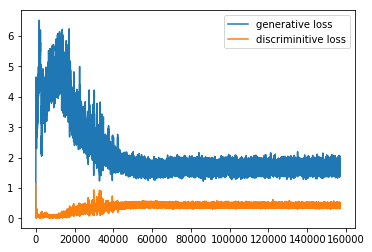


 Plot learning acc 



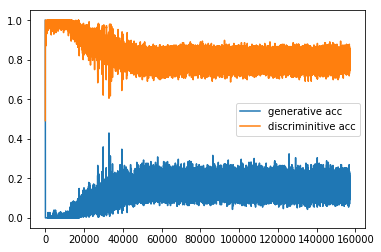

Discriminator loss:  0.40268975
Generator loss: 1.7721276


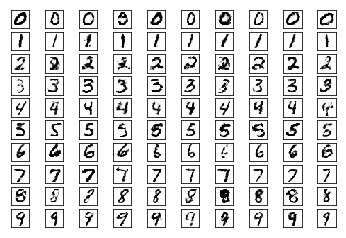


 Plot learning curves 



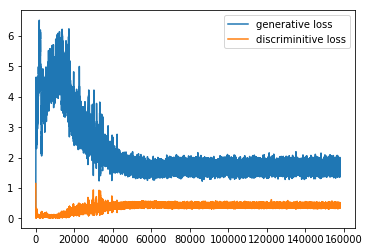


 Plot learning acc 



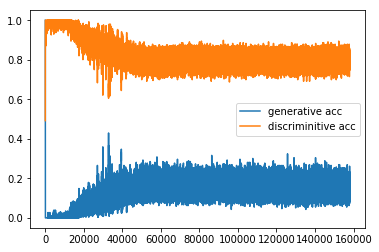

Discriminator loss:  0.45402253
Generator loss: 1.6592464


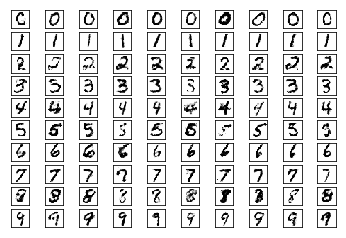


 Plot learning curves 



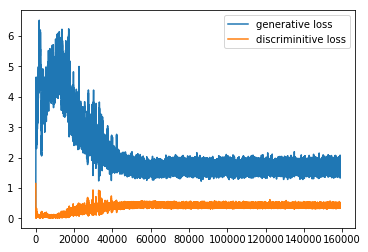


 Plot learning acc 



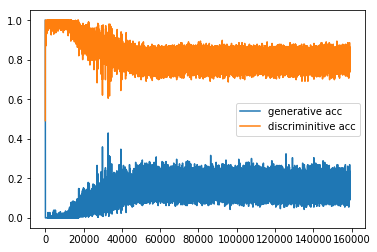

Discriminator loss:  0.4584051
Generator loss: 1.5610015


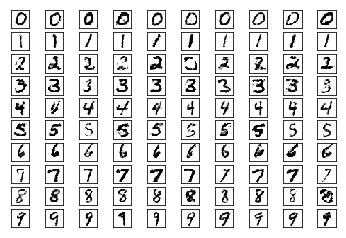


 Plot learning curves 



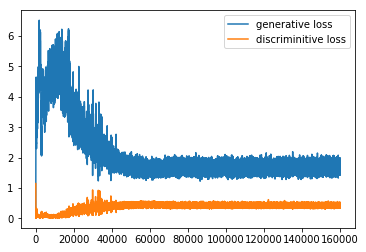


 Plot learning acc 



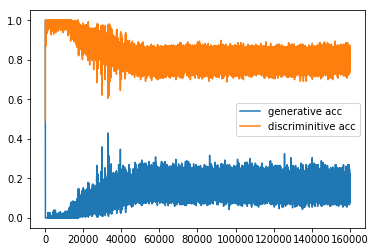

Discriminator loss:  0.3804516
Generator loss: 1.7109499


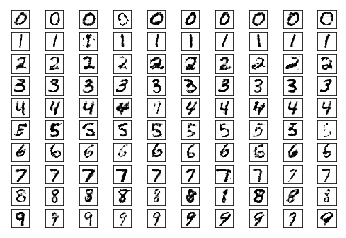


 Plot learning curves 



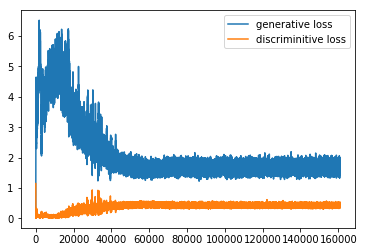


 Plot learning acc 



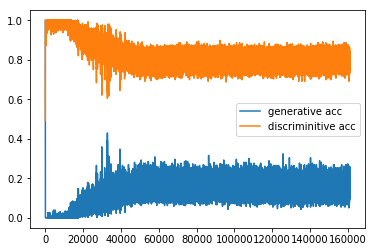

Discriminator loss:  0.42388454
Generator loss: 1.6702576


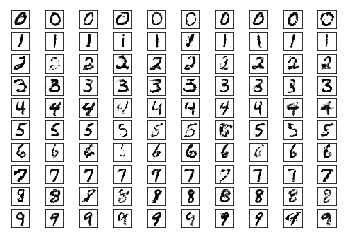


 Plot learning curves 



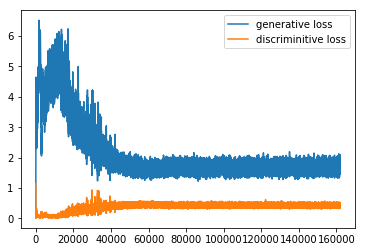


 Plot learning acc 



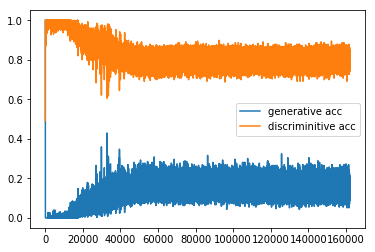

Discriminator loss:  0.3672105
Generator loss: 1.6900265


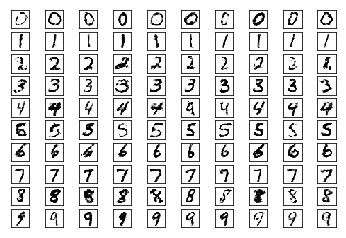


 Plot learning curves 



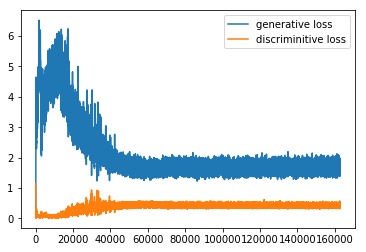


 Plot learning acc 



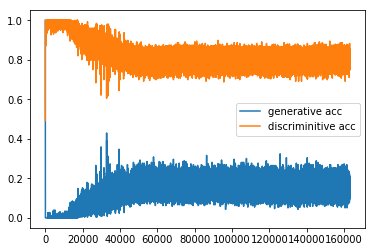

Discriminator loss:  0.39672303
Generator loss: 1.7370993


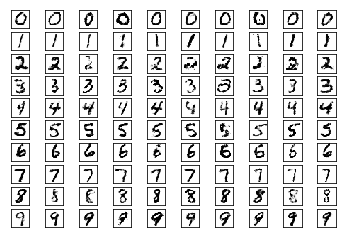


 Plot learning curves 



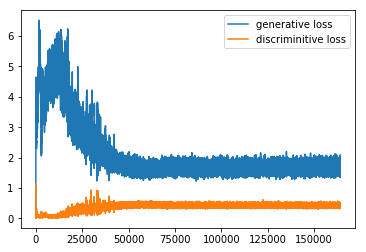


 Plot learning acc 



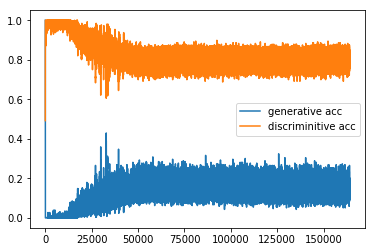

Discriminator loss:  0.3701482
Generator loss: 1.9978974


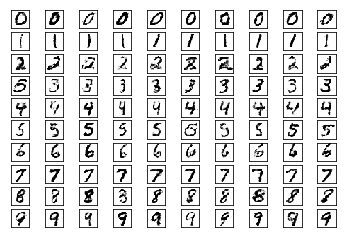


 Plot learning curves 



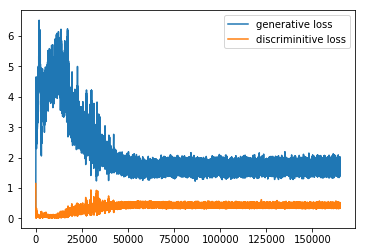


 Plot learning acc 



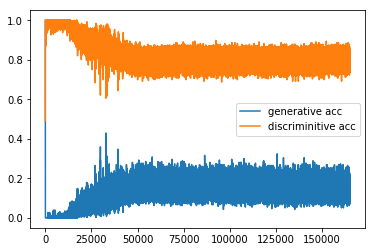

Discriminator loss:  0.35108513
Generator loss: 1.8422729


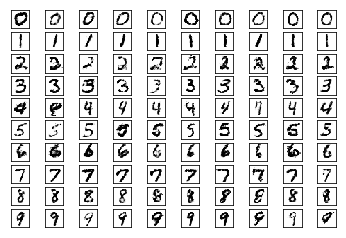


 Plot learning curves 



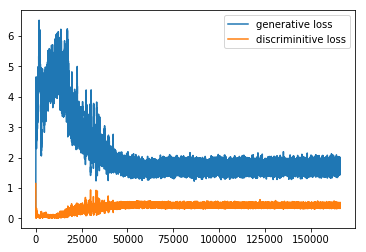


 Plot learning acc 



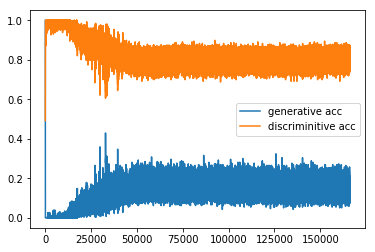

Discriminator loss:  0.4548831
Generator loss: 1.6484505


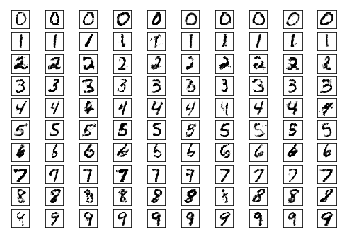


 Plot learning curves 



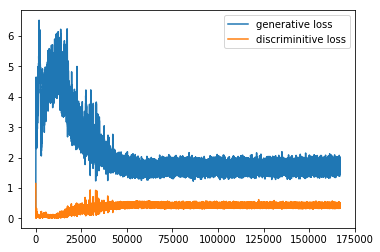


 Plot learning acc 



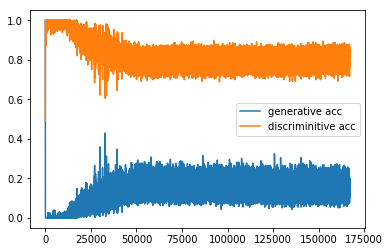

Discriminator loss:  0.3935619
Generator loss: 1.7082679


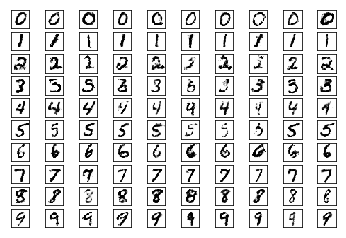


 Plot learning curves 



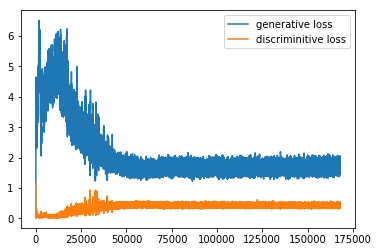


 Plot learning acc 



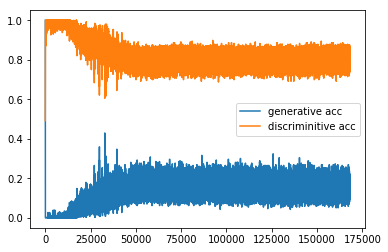

Discriminator loss:  0.40403825
Generator loss: 1.8378778


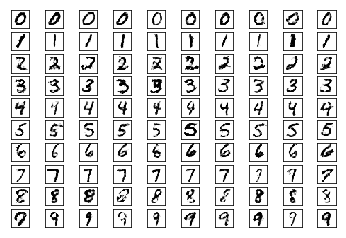


 Plot learning curves 



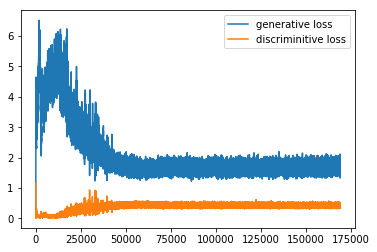


 Plot learning acc 



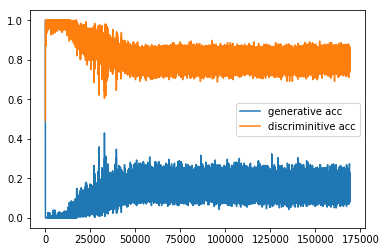

Discriminator loss:  0.38422823
Generator loss: 1.695759


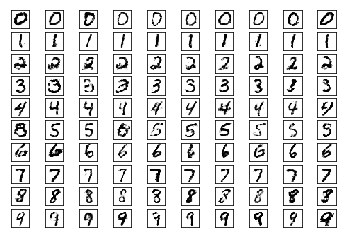


 Plot learning curves 



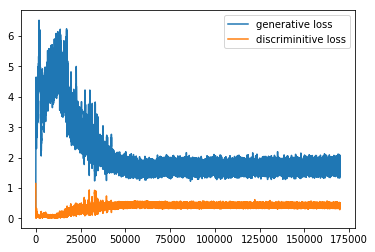


 Plot learning acc 



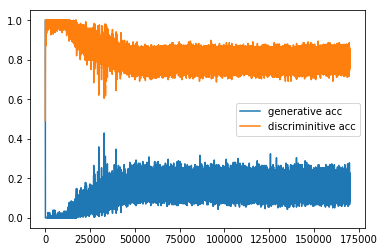

Discriminator loss:  0.43167976
Generator loss: 1.683002


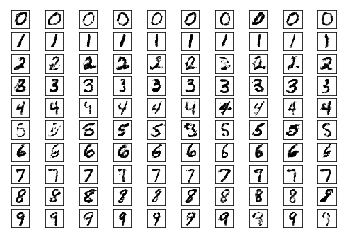


 Plot learning curves 



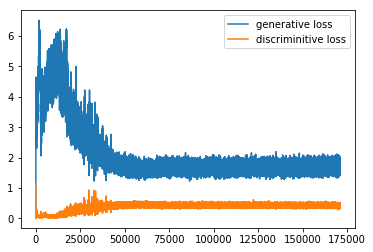


 Plot learning acc 



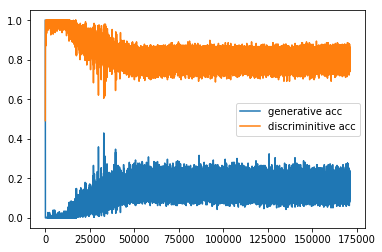

Discriminator loss:  0.44377714
Generator loss: 1.751905


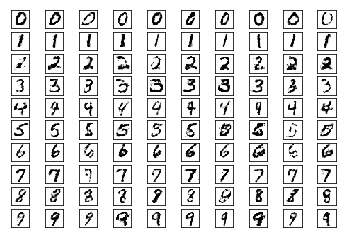


 Plot learning curves 



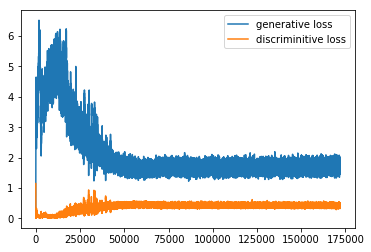


 Plot learning acc 



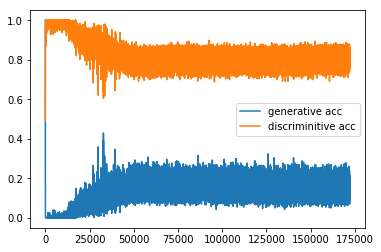

Discriminator loss:  0.32967475
Generator loss: 1.8868986


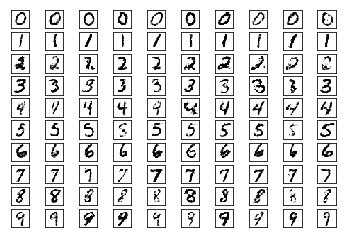


 Plot learning curves 



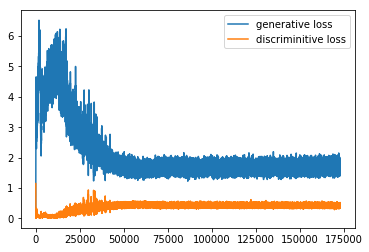


 Plot learning acc 



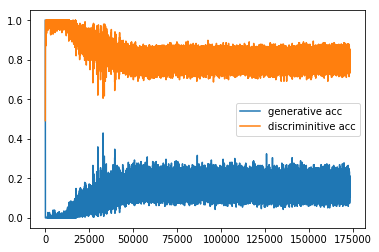

Discriminator loss:  0.41084313
Generator loss: 1.7330137


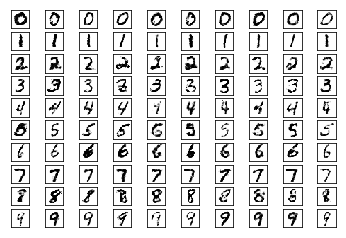


 Plot learning curves 



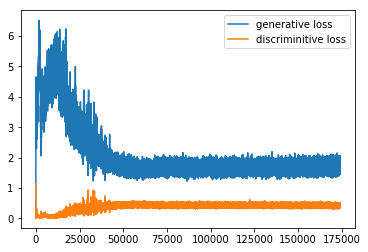


 Plot learning acc 



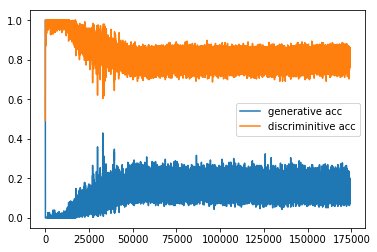

Discriminator loss:  0.5083133
Generator loss: 1.6708953


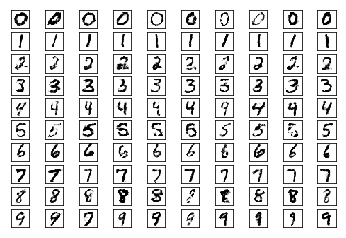


 Plot learning curves 



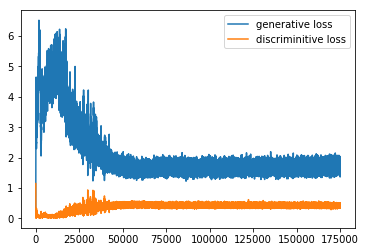


 Plot learning acc 



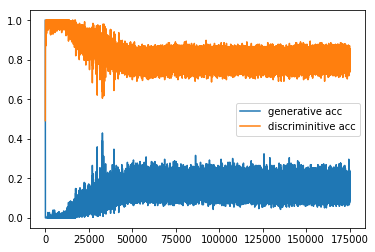

In [39]:



def random_Z(m, n=z):
    '''
    Random values for Z between -1 and 1
    
    :param m: number of samples
    :param n: dimension of Z
    :return: Vector with shape (m,n)
    '''
    return np.random.uniform(-1., 1., size=[m, n])


def plot_learning_curves(gan_loss,d_loss):
    print("\n Plot learning curves \n")

    plt.plot(gan_loss, label='generative loss')
    plt.plot(d_loss, label='discriminitive loss')
    plt.legend()
    plt.show()


def plot_learning_acc(gan_acc,d_acc):

    print("\n Plot learning acc \n")

    plt.plot(gan_acc, label='generative acc')
    plt.plot(d_acc, label='discriminitive acc')
    plt.legend()
    plt.show()

    
def show_info(losses):
    print("Discriminator loss: ",losses["d_loss"][-1])
    print("Generator loss:",losses["gan_loss"][-1])


    z_new = ut.random_Z(images_per_class*10,n=z)

    conditional_y = ut.one_hot(np.repeat(list(range(10)), images_per_class))

    generated_images = generator.predict_on_batch([z_new, conditional_y])
    ut.plot_mnist_images_conditonal(generated_images,per_class = images_per_class)

    plot_learning_curves(losses["gan_loss"],losses["d_loss"])
    plot_learning_acc(losses["gan_acc"],losses["d_acc"])
    
## Start graph computations and algorithm


batch_size = 256 #must be multiple of 2
epoach = 175000

##check summary again
#make_trainable(discriminator,True)
#discriminator.summary()
#make_trainable(discriminator,False)
#gan.summary()

#save losses 
losses = {}
losses["gan_loss"] = []
losses["d_loss"] = []
losses["gan_acc"] = []
losses["d_acc"] = []

for i in range(epoach):
    
    
    #random index
    x_index = np.random.randint(0,x_train.shape[0],size=batch_size//2)
    #select from tranning set
    real_images = x_train[x_index,:]
    real_images_labels = ut.one_hot(y_train[x_index])
    
    #generate images
    synthetic_images = generator.predict_on_batch([random_Z(batch_size//2),real_images_labels])
    
    d_x = np.concatenate((synthetic_images, real_images))
    d_x_label = np.concatenate((real_images_labels, real_images_labels))
    
    d_y = np.zeros([batch_size,1])
    
    d_y[batch_size//2:] = 1 #second half of the batch are true images so have label 1 and fake (first half) have label 0


    #first discriminator
    make_trainable(discriminator,True)
    d_loss = discriminator.train_on_batch([d_x,d_x_label],d_y)
    
    #second generator in adversarail faction
    gan_x = random_Z(batch_size)
    gan_y = np.ones([batch_size,1])
    #print("gan_x shape",gan_x.shape) 
    #print("gan_y shape",gan_y.shape)
    #print(gan_y)
    make_trainable(discriminator,False)
    gan_loss = gan.train_on_batch([gan_x,d_x_label],gan_y)
    
    losses["gan_loss"] += [gan_loss[0]]
    losses["d_loss"] += [d_loss[0]]
    losses["gan_acc"] += [gan_loss[1]]
    losses["d_acc"] += [d_loss[1]]
    
    
    print("Epoach",i,end='\r')
    
    if i%1000 == 0:
        show_info(losses)
        
show_info(losses)

### Analysing noise Z